# Transjakarta Data Analysis
1. What are the peak hours and days for ridership on different corridors/routes?
2. How do passengers move between different routes and corridors (tap in vs tap out locations)? Which routes are the most/least used?
3. Which stations or stops have the highest and lowest tap in/tap out activity?
4. Are there underserved areas with low bus stop density but high passenger demand based on tap out data? What regions or neighborhoods require new routes or additional bus stops?
5. What is the average journey time for passengers, and how does it vary across different routes and times of day?
6. Can we segment passengers based on their travel behavior (e.g., frequent vs. occasional riders, long vs. short-distance passengers)?
7. Are there specific stops where passengers face significant delays when tapping in or out (bottlenecks)?
8. What are the payment patterns across different user demographics? Are there any untapped opportunities to increase fare revenue?
9. Are there any inefficiencies in terms of bus arrival times, delays, or frequency that affect customer satisfaction?
10. What factors (e.g., journey time, route availability, station amenities) most affect customer satisfaction and retention?
## Initialize libraries and load csv file.

In [215]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from folium import PolyLine
from datetime import datetime

df = pd.read_csv('transjakarta.csv')

In [217]:
df['corridorName'].value_counts()

corridorName
Cibubur - Balai Kota                              391
Ciputat - CSW                                     383
Pulo Gadung - Monas                               343
Harmoni - Jakarta International Stadium           338
Kebayoran Lama - Tanah Abang                      333
                                                 ... 
Senen - Tanah Abang                                41
Gondangdia - Balai Kota                            40
Term. Pulo Gadung - Lampiri                        31
Tanah Abang - Kebayoran Lama via Pos Pengumben     23
Kampung Rambutan - Blok M                          17
Name: count, Length: 216, dtype: int64

## Step 1: Create a separate Dataframe 
### 1.1. Create DataFrame A (TJCorridor) with unique CorridorID and CorridorName, removing rows with blanks
Filter rows where either corridorID or corridorName is missing, then remove duplicates
### 1.2. Create DataFrame B (TJStops)
For respective type of tapin/out stops, select columns and rename them to a unified schema

In [219]:
# 1.1. 
df_TJCorridor = df[['corridorID', 'corridorName']].dropna().drop_duplicates().reset_index(drop=True)

# 1.2.
# tap in
tap_in_stops = df[['tapInStops', 'tapInStopsName', 'tapInStopsLat', 'tapInStopsLon']].copy()
tap_in_stops.columns = ['Stop', 'StopName', 'StopLat', 'StopLon']

# tap out
tap_out_stops = df[['tapOutStops', 'tapOutStopsName', 'tapOutStopsLat', 'tapOutStopsLon']].copy()
tap_out_stops.columns = ['Stop', 'StopName', 'StopLat', 'StopLon']

# Concatenate both tap-in and tap-out stops into a single DataFrame, removing duplicates and NaNs
df_TJStops = pd.concat([tap_in_stops, tap_out_stops], ignore_index=True).dropna().drop_duplicates().reset_index(drop=True)

# Display resulting DataFrames
df_TJCorridor.head(), df_TJCorridor.shape, df_TJStops.head(), df_TJStops.shape


(  corridorID                              corridorName
 0          5                     Matraman Baru - Ancol
 1         6C  Stasiun Tebet - Karet via Patra Kuningan
 2        R1A                        Pantai Maju - Kota
 3        11D       Pulo Gebang - Pulo Gadung 2 via PIK
 4         12                     Tanjung Priok - Pluit,
 (221, 2),
       Stop                StopName   StopLat    StopLon
 0   P00142               Pal Putih -6.184631  106.84402
 1  B01963P              Kemenkes 2 -6.228700  106.83302
 2  B00499P            Gg. Kunir II -6.133132  106.81435
 3  B05587P            Taman Elok 1 -6.195743  106.93526
 4   P00239  Sunter Boulevard Barat -6.149650  106.88900,
 (3601, 4))

In [221]:
df_TJStops

,Stop,StopName,StopLat,StopLon
0,P00142,Pal Putih,-6.184631,106.84402
1,B01963P,Kemenkes 2,-6.228700,106.83302
2,B00499P,Gg. Kunir II,-6.133132,106.81435
3,B05587P,Taman Elok 1,-6.195743,106.93526
4,P00239,Sunter Boulevard Barat,-6.149650,106.88900
...,...,...,...,...
3596,B04740P,Simpang Bundaran Ikan Harapan Indah Raya 1,-6.181458,106.98134
3597,B03342P,SDN Cengkareng Barat 05,-6.149878,106.72239
3598,P00284,Stasiun Jatinegara Arah Selatan,-6.215541,106.87436
3599,B02471P,MNC Studios,-6.190376,106.76625


## Step 2: Data Cleaning
### 2.1. Missing Value Handling: Match the stops ID and stops corridor with missing data

In [223]:
# Delete the specified columns from df
df = df.drop(columns=['tapInStops', 'tapInStopsName', 'tapOutStops', 'tapOutStopsName'])

# Match TapInStopsLat and TapInStopsLon with StopLat and StopLon from df_TJStops
# Rename the columns in df_TJStops for easier merging
df_TJStops_renamed = df_TJStops.rename(columns={'StopLat': 'tapInStopsLat', 'StopLon': 'tapInStopsLon'})

# Merge df with df_TJStops to get TapInStops and TapInStopsName
df = df.merge(df_TJStops_renamed[['tapInStopsLat', 'tapInStopsLon', 'Stop', 'StopName']], 
               how='left', 
               left_on=['tapInStopsLat', 'tapInStopsLon'], 
               right_on=['tapInStopsLat', 'tapInStopsLon'])

# Rename the new columns to TapInStops and TapInStopsName
df = df.rename(columns={'Stop': 'tapInStops', 'StopName': 'tapInStopsName'})

# Step 3: Match TapOutStopsLat and TapOutStopsLon with StopLat and StopLon from df_TJStops
# Rename the columns in df_TJStops for the out stops
df_TJStops_renamed_out = df_TJStops.rename(columns={'StopLat': 'tapOutStopsLat', 'StopLon': 'tapOutStopsLon'})

# Merge df with df_TJStops to get TapOutStops and TapOutStopsName
df = df.merge(df_TJStops_renamed_out[['tapOutStopsLat', 'tapOutStopsLon', 'Stop', 'StopName']], 
               how='left', 
               left_on=['tapOutStopsLat', 'tapOutStopsLon'], 
               right_on=['tapOutStopsLat', 'tapOutStopsLon'])

# Rename the new columns to TapOutStops and TapOutStopsName
df = df.rename(columns={'Stop': 'tapOutStops', 'StopName': 'tapOutStopsName'})

# Define the desired column order
column_order = [
    'transID', 
    'payCardID', 
    'payCardBank', 
    'payCardName', 
    'payCardSex', 
    'payCardBirthDate', 
    'corridorID', 
    'corridorName', 
    'direction', 
    'tapInStops', 
    'tapInStopsName', 
    'tapInStopsLat', 
    'tapInStopsLon', 
    'stopStartSeq', 
    'tapInTime', 
    'tapOutStops', 
    'tapOutStopsName', 
    'tapOutStopsLat', 
    'tapOutStopsLon', 
    'stopEndSeq', 
    'tapOutTime', 
    'payAmount'
]

# Reorder the DataFrame columns
df = df.reindex(columns=column_order)

# Create a copy of df to avoid modifying the original DataFrame
df_copy = df.copy()

# Step 1: Merge df with df_TJCorridor to get corridorName based on corridorID
df_copy = df_copy.merge(df_TJCorridor, on='corridorID', how='left', suffixes=('', '_corridor'))

# Step 2: Fill the missing corridorName in df_copy
df_copy['corridorName'] = df_copy['corridorName'].fillna(df_copy['corridorName_corridor'])

# Step 3: Fill the missing corridorID based on corridorName
# Merge again to get corridorID based on corridorName
df_copy = df_copy.merge(df_TJCorridor, on='corridorName', how='left', suffixes=('', '_corridor'))

# Step 4: Fill the missing corridorID
df_copy['corridorID'] = df_copy['corridorID'].fillna(df_copy['corridorID_corridor'])

# Step 5: Drop the extra columns from the merges
df_copy = df_copy.drop(columns=['corridorName_corridor', 'corridorID_corridor'])

# Update the original df with the filled values
df = df_copy

# Display the updated DataFrame
df.head()

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapInStopsLon,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0
1,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,106.84402,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0
2,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,106.83302,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0
3,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,106.81435,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0
4,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,106.93526,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0


# 2.1a. Check how many tapOuts are empty

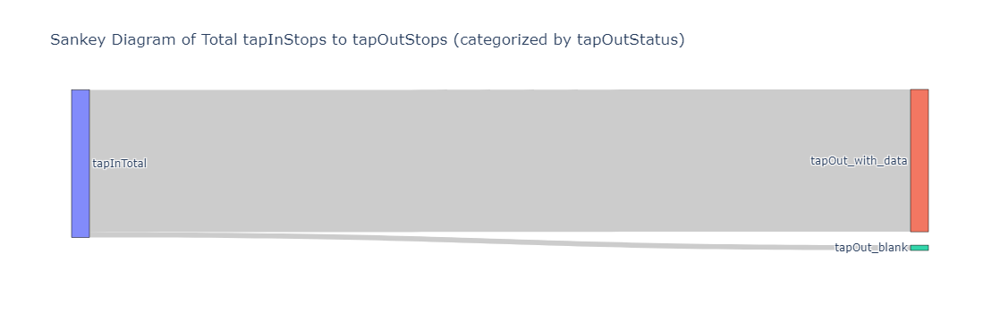

In [225]:
import pandas as pd
import plotly.graph_objects as go

# Step 1: Categorize tapOutStops into "with data" or "blank"
df['tapOutStatus'] = df['tapOutStops'].apply(lambda x: 'with_data' if pd.notna(x) else 'blank')

# Step 2: Aggregate data for Sankey chart by tapOutStatus only
sankey_data = df.groupby('tapOutStatus').size().reset_index(name='count')

# Step 3: Define node labels
nodes = ['tapInTotal', 'tapOut_with_data', 'tapOut_blank']

# Map nodes to their indices
node_indices = {node: idx for idx, node in enumerate(nodes)}

# Step 4: Define source, target, and value lists for the Sankey diagram
sources = []
targets = []
values = []

# Create links from tapInTotal to each tapOutStatus category
for _, row in sankey_data.iterrows():
    sources.append(node_indices['tapInTotal'])
    target_node = 'tapOut_with_data' if row['tapOutStatus'] == 'with_data' else 'tapOut_blank'
    targets.append(node_indices[target_node])
    values.append(row['count'])

# Step 5: Create the Sankey diagram
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=nodes,
    ),
    link=dict(
        source=sources,
        target=targets,
        value=values,
    )
))

fig.update_layout(title_text="Sankey Diagram of Total tapInStops to tapOutStops (categorized by tapOutStatus)", font_size=12)
fig.show()

### 2.2. Missing Value Handling: Imputation
* corridorID and Card name -> mode
* Pay Amount -> median
### 2.3. Drop Rows with Blank Data

In [227]:
# 2.2.

# Step 1: Create a function to impute missing values based on the mode
def impute_with_mode(df, group_col, target_col):
    mode_values = df.groupby(group_col)[target_col].agg(lambda x: x.mode().iloc[0] if not x.mode().empty else None)
    df[target_col] = df.apply(lambda row: mode_values[row[group_col]] if pd.isna(row[target_col]) else row[target_col], axis=1)
    return df

# Step 2: Impute missing corridorID based on payCardName
df = impute_with_mode(df, 'payCardName', 'corridorID')

# Step 3: Impute missing corridorName based on payCardName
df = impute_with_mode(df, 'payCardName', 'corridorName')

# Step 4: Impute missing values in payAmount with the median value
median_pay_amount = df['payAmount'].median()
df['payAmount'] = df['payAmount'].fillna(median_pay_amount)

# 2.3. Drop Rows with Blank Data

# Create a new DataFrame by filtering out rows with blank tapOutStops
df_filtered = df[df['tapOutStops'].notna() & (df['tapOutStops'] != '')].copy()
df_filtered.dropna(inplace=True)

# Display the new DataFrame
df = df_filtered
df.head()


,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,stopStartSeq,tapInTime,tapOutStops,tapOutStopsName,tapOutStopsLat,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,tapOutStatus
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0,with_data
1,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,7,2023-04-03 05:21:44,P00253,Tegalan,-6.203101,106.85715,12.0,2023-04-03 06:00:53,3500.0,with_data
2,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,13,2023-04-03 05:42:44,B03307P,Sampoerna Strategic,-6.217152,106.81892,21.0,2023-04-03 06:40:01,3500.0,with_data
3,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,38,2023-04-03 05:59:06,B04962P,Simpang Kunir Kemukus,-6.133731,106.81475,39.0,2023-04-03 06:50:55,3500.0,with_data
4,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,23,2023-04-03 05:44:51,B03090P,Raya Penggilingan,-6.183068,106.93194,29.0,2023-04-03 06:28:16,3500.0,with_data


In [228]:
print(f"Original number of rows: {len(df)}")


df = df.drop_duplicates(subset='transID', keep='first')


print(f"Number of rows after removing duplicates: {len(df)}")

Original number of rows: 37935
Number of rows after removing duplicates: 36520


### 2.4. Check for empty data

In [231]:
# Calculate the number of missing values for each column
missing_data = df.isnull().sum()

# Calculate the percentage of missing data for each column
missing_percentage = (missing_data / len(df)) * 100

# Combine both counts and percentages into a DataFrame for easy viewing
missing_summary = pd.DataFrame({
    'Missing Count': missing_data,
    'Missing Percentage': missing_percentage
}).sort_values(by='Missing Count', ascending=False)

print("Missing Data Summary:")
print(missing_summary)

Missing Data Summary:
                  Missing Count  Missing Percentage
transID                       0                 0.0
tapInStopsLon                 0                 0.0
payAmount                     0                 0.0
tapOutTime                    0                 0.0
stopEndSeq                    0                 0.0
tapOutStopsLon                0                 0.0
tapOutStopsLat                0                 0.0
tapOutStopsName               0                 0.0
tapOutStops                   0                 0.0
tapInTime                     0                 0.0
stopStartSeq                  0                 0.0
tapInStopsLat                 0                 0.0
payCardID                     0                 0.0
tapInStopsName                0                 0.0
tapInStops                    0                 0.0
direction                     0                 0.0
corridorName                  0                 0.0
corridorID                    0           

In [233]:
# Step 1: Identify the most frequent 'corridorName' per 'corridorID'
corridor_mode = (
    df.groupby(['corridorID', 'corridorName'])
    .size()
    .reset_index(name='corridorName_count')
)

# Sort values to find the most frequent corridorName
corridor_mode = corridor_mode.sort_values(['corridorID', 'corridorName_count'], ascending=[True, False])

# Keep only the highest occurrence corridorName per corridorID
most_frequent_corridorName = corridor_mode.drop_duplicates('corridorID', keep='first')

# Create a dictionary mapping corridorID to the most frequent corridorName
corridor_map = most_frequent_corridorName.set_index('corridorID')['corridorName'].to_dict()

# Step 2: Replace 'corridorName' in the original dataframe with the most frequent one using .loc
df.loc[:, 'corridorName'] = df['corridorID'].map(corridor_map)

# Display the corrected dataframe
print(df[['corridorID', 'corridorName']].drop_duplicates())


      corridorID                                    corridorName
0              5                           Matraman Baru - Ancol
2             6C        Stasiun Tebet - Karet via Patra Kuningan
3            R1A                              Pantai Maju - Kota
4            11D             Pulo Gebang - Pulo Gadung 2 via PIK
5             12                           Tanjung Priok - Pluit
...          ...                                             ...
33367         1R                             Senen - Tanah Abang
33403         7B                       Kampung Rambutan - Blok M
33447         M5                           Matraman Baru - Ancol
33499     JAK.99                     Term. Pulo Gadung - Lampiri
33604     JAK.12  Tanah Abang - Kebayoran Lama via Pos Pengumben

[221 rows x 2 columns]


In [235]:
# Group by 'corridorID' and count unique 'corridorName' entries for each
corridor_counts = df.groupby('corridorID')['corridorName'].nunique().reset_index()
corridor_counts.columns = ['corridorID', 'unique_corridorName_count']

# Sort by the unique count in descending order
corridor_counts_sorted = corridor_counts.sort_values(by='unique_corridorName_count', ascending=False).reset_index(drop=True)

# Display the sorted table
corridor_counts_sorted


,corridorID,unique_corridorName_count
0,1,1
1,JAK.31,1
2,JAK.20,1
3,JAK.21,1
4,JAK.22,1
...,...,...
216,6P,1
217,6Q,1
218,6T,1
219,6U,1


### 2.5. Merge Corridor Category to Transjakarta Dataframe

In [239]:
# Step 1: Import the new CSV file into a DataFrame
corridors_df = pd.read_csv('Transjakarta_Corridors.csv')

# Step 2: Merge the corridorCategory to the original df
merged_df = df.merge(corridors_df, on='corridorID', how='left')

# Display the first few rows of the merged DataFrame
print(merged_df.head())

          transID         payCardID payCardBank      payCardName payCardSex  \
0  EIIW227B8L34VB   180062659848800      emoney   Bajragin Usada          M   
1  LGXO740D2N47GZ  4885331907664776         dki     Gandi Widodo          F   
2  DJWR385V2U57TO  4996225095064169         dki    Emong Wastuti          F   
3  JTUZ800U7C86EH      639099174703       flazz     Surya Wacana          F   
4  VMLO535V7F95NJ      570928206772       flazz  Embuh Mardhiyah          M   

   payCardBirthDate corridorID                            corridorName_x  \
0              2008          5                     Matraman Baru - Ancol   
1              1997         6C  Stasiun Tebet - Karet via Patra Kuningan   
2              1992        R1A                        Pantai Maju - Kota   
3              1978        11D       Pulo Gebang - Pulo Gadung 2 via PIK   
4              1982         12                     Tanjung Priok - Pluit   

   direction tapInStops  ... tapOutStops        tapOutStopsName  \
0

In [241]:
# Count tap-ins and tap-outs based on latitude
tap_in_counts = df['tapInStopsLat'].value_counts().reset_index()
tap_in_counts.columns = ['Latitude', 'tapIn_count']

tap_out_counts = df['tapOutStopsLat'].value_counts().reset_index()
tap_out_counts.columns = ['Latitude', 'tapOut_count']

# Merge counts on Latitude
station_counts = pd.merge(tap_in_counts, tap_out_counts, on='Latitude', how='outer').fillna(0)

# Add station name for each latitude by getting a unique name for each latitude
# Assuming the station names are consistent for the same latitude
tap_in_names = df[['tapInStopsLat', 'tapInStopsName']].drop_duplicates().set_index('tapInStopsLat')
tap_out_names = df[['tapOutStopsLat', 'tapOutStopsName']].drop_duplicates().set_index('tapOutStopsLat')

# Combine tap-in and tap-out station names into a single dictionary
station_names = tap_in_names['tapInStopsName'].combine_first(tap_out_names['tapOutStopsName']).to_dict()

# Map station names based on latitude
station_counts['Station Name'] = station_counts['Latitude'].map(station_names)

# Reorder columns
station_counts = station_counts[['Station Name', 'tapIn_count', 'tapOut_count']]

# Display the resulting table
station_counts

,Station Name,tapIn_count,tapOut_count
0,Balaikota Depok 2,37.0,1.0
1,Term. Depok Baru,0.0,45.0
2,ACE Hardware,7.0,1.0
3,D Mall,21.0,0.0
4,Gg. Beringin,2.0,0.0
...,...,...,...
3543,Seberang Food Street,5.0,21.0
3544,Food Street,0.0,41.0
3545,Melody Golf 2,1.0,0.0
3546,Melody Golf,19.0,25.0


## 2.6. Universal Conversion

In [243]:
# Convert time columns to datetime if necessary
df['tapInTime'] = pd.to_datetime(df['tapInTime'])
df['tapOutTime'] = pd.to_datetime(df['tapOutTime'])

# Calculate additional fields if needed
df['journeyTime'] = (df['tapOutTime'] - df['tapInTime']).dt.total_seconds() / 60  # journey time in minutes
df['dayOfWeek'] = df['tapInTime'].dt.day_name()
df['tapInHour'] = df['tapInTime'].dt.hour


# Define age
df['age'] = 2024 - df['payCardBirthDate']

# Segment age group
df['age_group'] = np.where(df['age'] < 19, 'Student', 'Non-Student')

df.head()

C:\Users\Farrel\AppData\Local\Temp\ipykernel_21316\1671581480.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Farrel\AppData\Local\Temp\ipykernel_21316\1671581480.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Farrel\AppData\Local\Temp\ipykernel_21316\1671581480.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,tapOutStatus,journeyTime,dayOfWeek,tapInHour,age,age_group
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,106.85715,12.0,2023-04-03 06:00:53,3500.0,with_data,39.150000,Monday,5,16,Student
2,LGXO740D2N47GZ,4885331907664776,dki,Gandi Widodo,F,1997,6C,Stasiun Tebet - Karet via Patra Kuningan,0.0,B01963P,...,106.81892,21.0,2023-04-03 06:40:01,3500.0,with_data,57.283333,Monday,5,27,Non-Student
3,DJWR385V2U57TO,4996225095064169,dki,Emong Wastuti,F,1992,R1A,Pantai Maju - Kota,0.0,B00499P,...,106.81475,39.0,2023-04-03 06:50:55,3500.0,with_data,51.816667,Monday,5,32,Non-Student
4,JTUZ800U7C86EH,639099174703,flazz,Surya Wacana,F,1978,11D,Pulo Gebang - Pulo Gadung 2 via PIK,0.0,B05587P,...,106.93194,29.0,2023-04-03 06:28:16,3500.0,with_data,43.416667,Monday,5,46,Non-Student
5,VMLO535V7F95NJ,570928206772,flazz,Embuh Mardhiyah,M,1982,12,Tanjung Priok - Pluit,0.0,P00239,...,106.81143,15.0,2023-04-03 06:57:03,3500.0,with_data,39.466667,Monday,6,42,Non-Student


## 2.7. Create a passenger dataframe

In [245]:
import pandas as pd

# Group by 'payCardName' and aggregate necessary information
summary_df = df.groupby('payCardID').agg(
    payCardID=('payCardID', 'first'),
    Passenger=('payCardName', 'first'),
    age=('age', 'first'),
    age_group=('age_group', 'first'),
    payCardSex=('payCardSex', 'first'),
    payCardBank=('payCardBank', 'first'),
    total_number_of_Transactions=('payCardName', 'size'),  # Count of transactions
    Most_frequent_corridorName=('corridorName', lambda x: x.mode().iloc[0] if not x.mode().empty else None),
    Most_frequent_tapInStopsName=('tapInStopsName', lambda x: x.mode().iloc[0] if not x.mode().empty else None),
    Most_Frequent_tapOutStopsName=('tapOutStopsName', lambda x: x.mode().iloc[0] if not x.mode().empty else None),
    signup_date=('tapInTime', 'min'),  # First tapInTime for signup date
    last_active_date=('tapOutTime', 'max')  # Last tapOutTime for last active date
).reset_index(drop=True)

# Display the summary DataFrame
summary_df.head()


,payCardID,Passenger,age,age_group,payCardSex,payCardBank,total_number_of_Transactions,Most_frequent_corridorName,Most_frequent_tapInStopsName,Most_Frequent_tapOutStopsName,signup_date,last_active_date
0,60403675436,Dr. Taufan Jailani,35,Non-Student,F,flazz,38,Depok - BKN,Sbr. Gg. Saminten,BKN,2023-04-03 07:05:44,2023-04-28 20:23:03
1,60404498697,Sutan Imam Nasyidah,35,Non-Student,M,flazz,38,Tanah Abang - Kebayoran Lama,Jln. Asshofa Raya,Sbr. Sekolah Bethel,2023-04-03 07:40:42,2023-04-28 20:49:45
2,60417020934,Hardana Nashiruddin,59,Non-Student,F,flazz,4,Grogol - Tubagus Angke,Jln. Mokmer 1,Jembatan Perempatan Cempaka Putih Timur,2023-04-08 15:35:12,2023-04-30 19:48:11
3,60421208343,Natalia Hakim,21,Non-Student,M,flazz,4,BSD Serpong - Fatmawati,Gatot Subroto Jamsostek Arah Barat,Bundaran Senayan,2023-04-08 08:27:52,2023-04-29 22:22:31
4,60427539402,"Lanang Firmansyah, M.Farm",41,Non-Student,F,flazz,1,Ragunan - MH Thamrin via Kuningan,Kuningan Timur,Pejaten,2023-04-12 13:26:00,2023-04-12 16:22:23


# Export dataframes to csv

In [247]:
summary_df.to_csv('df_passengers.csv', index = False)
df.to_csv('df_tj.csv', index = False)

In [249]:
# Step 1: Group by tapInStopsName and tapOutStopsName to get total passengers for each connection
connection_counts = df.groupby(['tapInStopsName', 'tapOutStopsName']).size().reset_index(name='total_passenger')

# Step 2: Calculate the branch count (unique tapOutStopsName) for each tapInStopsName
branch_counts = connection_counts.groupby('tapInStopsName')['tapOutStopsName'].nunique().reset_index(name='branch')

# Step 3: Merge branch count data with the connection counts
result_df = connection_counts.merge(branch_counts, on='tapInStopsName')

# Step 4: Rename columns for clarity
result_df = result_df.rename(columns={
    'tapInStopsName': 'tapInStopsName',
    'tapOutStopsName': 'tapOutStopsName_that_connects_to_tapInStopsName',
    'total_passenger': 'total_passenger',
    'branch': 'branch'
})

# Display the result
result_df


,tapInStopsName,tapOutStopsName_that_connects_to_tapInStopsName,total_passenger,branch
0,18 Office Park,Gg. Puskesmas Kebagusan Raya,19,1
1,ACC Simatupang,Taman Lenteng Agung,1,1
2,ACE Hardware,Term. Depok Baru,7,1
3,AKR Tower,MNC Studios,1,1
4,ASEAN,Kejaksaan Agung,21,1
...,...,...,...,...
4386,Yayasan Muhammadiyah 2,Rusun Tanah Abang 2,20,2
4387,Yayasan Nurul Ihsan Pulo Gebang,Jln. Permata Indah 8,1,1
4388,Yayasan Perguruan Rakyat 2,STIE Trianandra,1,1
4389,Yon Arhanud - 10 Pesanggrahan,Jln. Manunggal II Petukangan,18,1


In [251]:
result_df[result_df['branch'] > 9]

,tapInStopsName,tapOutStopsName_that_connects_to_tapInStopsName,total_passenger,branch
105,BNN Arah Barat,BKN,1,11
106,BNN Arah Barat,Cawang UKI,20,11
107,BNN Arah Barat,Cikoko Stasiun Cawang Arah Barat,1,11
108,BNN Arah Barat,Gelanggang Remaja,1,11
109,BNN Arah Barat,PGC 2,1,11
...,...,...,...,...
4246,Tosari,Kuningan Utama,1,11
4247,Tosari,Manggala Wanabakti,21,11
4248,Tosari,SMK 57,1,11
4249,Tosari,UNJ,1,11


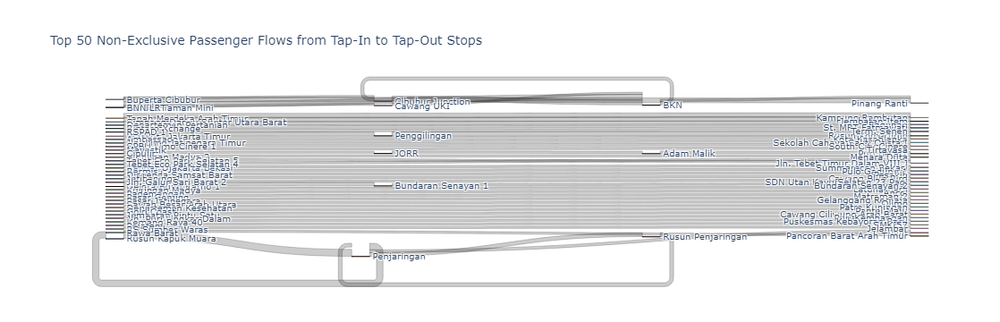

In [253]:
import pandas as pd
import plotly.graph_objects as go

# Set the top variable to adjust the number of top flows shown
top_n = 50  # Change this to show the top N flows

# Step 1: Count flows between tap-in and tap-out stops
flow_counts = df.groupby(['tapInStopsName', 'tapOutStopsName']).size().reset_index(name='count')

# Identify stops that are non-exclusive (appear in both tap-in and tap-out)
tap_in_stops = flow_counts['tapInStopsName'].unique()
tap_out_stops = flow_counts['tapOutStopsName'].unique()
non_exclusive_stops = set(tap_in_stops).intersection(tap_out_stops)

# Step 2: Filter flows to only include those with non-exclusive stops
non_exclusive_flows = flow_counts[
    (flow_counts['tapInStopsName'].isin(non_exclusive_stops)) | 
    (flow_counts['tapOutStopsName'].isin(non_exclusive_stops))
]

# Select top N flows from non-exclusive flows for display
top_flows = non_exclusive_flows.nlargest(top_n, 'count')

# Step 3: Create a combined list of unique stations from the filtered top flows
stations = pd.Index(pd.concat([top_flows['tapInStopsName'], top_flows['tapOutStopsName']]).unique())
station_labels = stations.tolist()

# Map each station to an index
station_map = {station: i for i, station in enumerate(station_labels)}

# Step 4: Map tap-in and tap-out stops to indices for the Sankey diagram
top_flows['tapInIndex'] = top_flows['tapInStopsName'].map(station_map)
top_flows['tapOutIndex'] = top_flows['tapOutStopsName'].map(station_map)

# Step 5: Define the Sankey diagram's data
sankey_data = dict(
    type='sankey',
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=station_labels
    ),
    link=dict(
        source=top_flows['tapInIndex'],
        target=top_flows['tapOutIndex'],
        value=top_flows['count']
    )
)

# Step 6: Create the Sankey figure with increased height
fig = go.Figure(go.Sankey(sankey_data))

# Update layout to set the title dynamically based on top_n and increase height
fig.update_layout(
    title_text=f"Top {top_n} Non-Exclusive Passenger Flows from Tap-In to Tap-Out Stops",
    font_size=10,
    height=900  # Increase height if needed for better readability
)

# Display the plot
fig.show()


# 3. Exploratory Data Analysis
## 3.1. Statistical Test

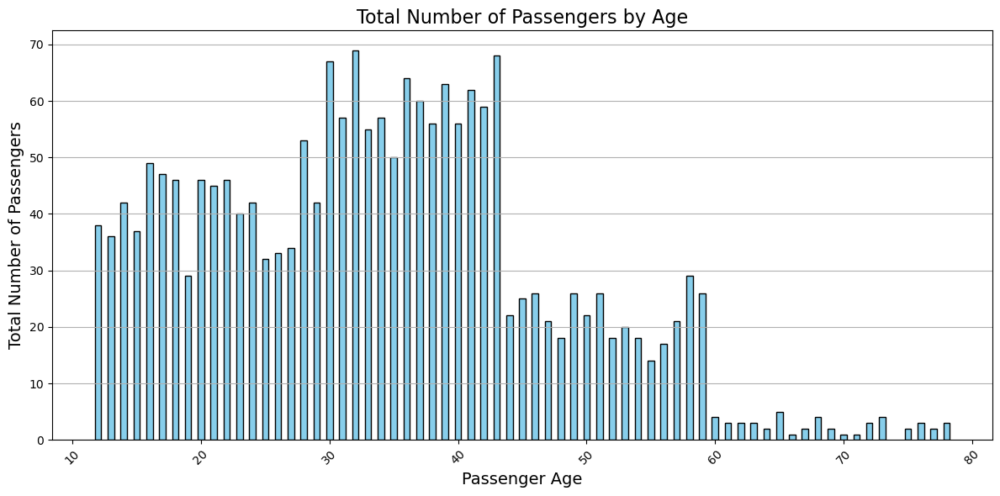

In [255]:
import matplotlib.pyplot as plt

# Group by age and count the number of passengers
age_counts = summary_df['age'].value_counts().sort_index()

# Create a thin bar chart
plt.figure(figsize=(12, 6))
plt.bar(age_counts.index, age_counts.values, width=0.5, color='skyblue', edgecolor='black')

# Set the title and labels
plt.title('Total Number of Passengers by Age', fontsize=16)
plt.xlabel('Passenger Age', fontsize=14)
plt.ylabel('Total Number of Passengers', fontsize=14)

# Optionally, rotate the x-ticks for better visibility
plt.xticks(rotation=45)

# Show the grid for better readability
plt.grid(axis='y')

# Display the bar chart
plt.tight_layout()
plt.show()


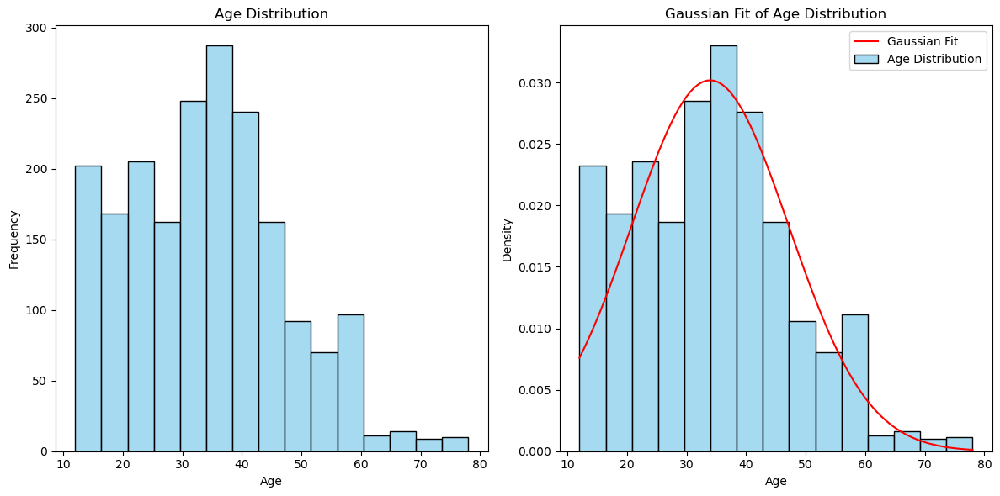

In [257]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
import numpy as np

# Set up the figure
plt.figure(figsize=(12, 6))

# (1) Distribution of Age
plt.subplot(1, 2, 1)
sns.histplot(summary_df['age'], bins=15, kde=False, color='skyblue')
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')

# (2) Gaussian Distribution of Age
plt.subplot(1, 2, 2)
# Calculate the mean and standard deviation for a Gaussian fit
mean_age = summary_df['age'].mean()
std_age = summary_df['age'].std()

# Plot the histogram with density=True to normalize it
sns.histplot(summary_df['age'], bins=15, kde=False, stat='density', color='skyblue', label='Age Distribution')

# Overlay a Gaussian curve
age_range = np.linspace(summary_df['age'].min(), summary_df['age'].max(), 100)
plt.plot(age_range, norm.pdf(age_range, mean_age, std_age), color='red', label='Gaussian Fit')
plt.title('Gaussian Fit of Age Distribution')
plt.xlabel('Age')
plt.ylabel('Density')
plt.legend()

plt.tight_layout()
plt.show()


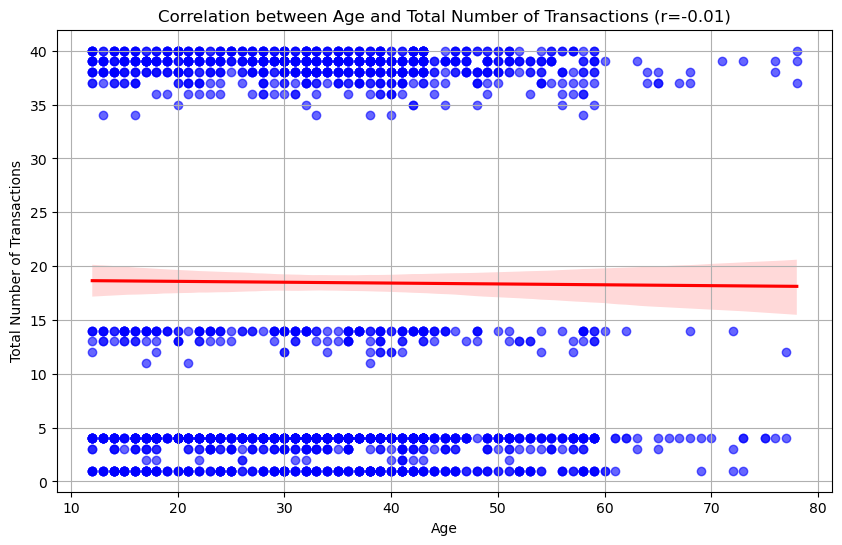

In [259]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set up the figure
plt.figure(figsize=(10, 6))

# Create a scatter plot with a regression line
sns.regplot(x='age', y='total_number_of_Transactions', data=summary_df, 
            scatter_kws={'alpha':0.6, 'color':'blue'}, 
            line_kws={'color':'red'})

# Calculate and display the correlation coefficient
correlation = summary_df['age'].corr(summary_df['total_number_of_Transactions'])
plt.title(f'Correlation between Age and Total Number of Transactions (r={correlation:.2f})')
plt.xlabel('Age')
plt.ylabel('Total Number of Transactions')

plt.grid(True)
plt.show()


## It was revealed that segmentation can be made with total number of transactions

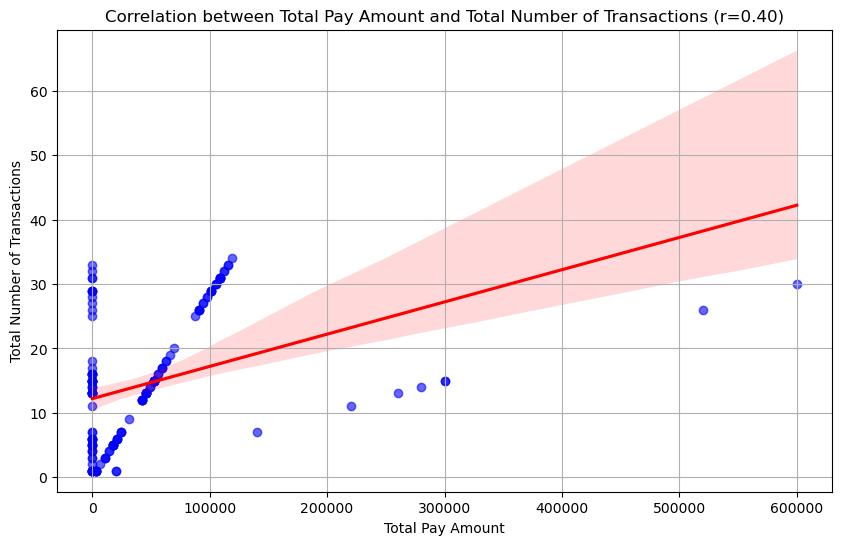

In [261]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Aggregate to get total transactions and total pay amount for each payCardID
student_df = df[(df['age_group'] == 'Student') & (df['dayOfWeek'].isin(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'])) &  ((df['tapInTime'].dt.hour.between(5, 8)) | (df['tapInTime'].dt.hour.between(12, 16)))].groupby('payCardID').agg(
    total_number_of_Transactions=('transID', 'count'),  # Count of transactions
    total_payAmount=('payAmount', 'sum')  # Sum of pay amounts
).reset_index()

# Set up the figure
plt.figure(figsize=(10, 6))

# Create a scatter plot with a regression line
sns.regplot(x='total_payAmount', y='total_number_of_Transactions', data=student_df, 
            scatter_kws={'alpha': 0.6, 'color': 'blue'}, 
            line_kws={'color': 'red'})

# Calculate and display the correlation coefficient
correlation = student_df['total_payAmount'].corr(student_df['total_number_of_Transactions'])
plt.title(f'Correlation between Total Pay Amount and Total Number of Transactions (r={correlation:.2f})')
plt.xlabel('Total Pay Amount')
plt.ylabel('Total Number of Transactions')

plt.grid(True)
plt.show()


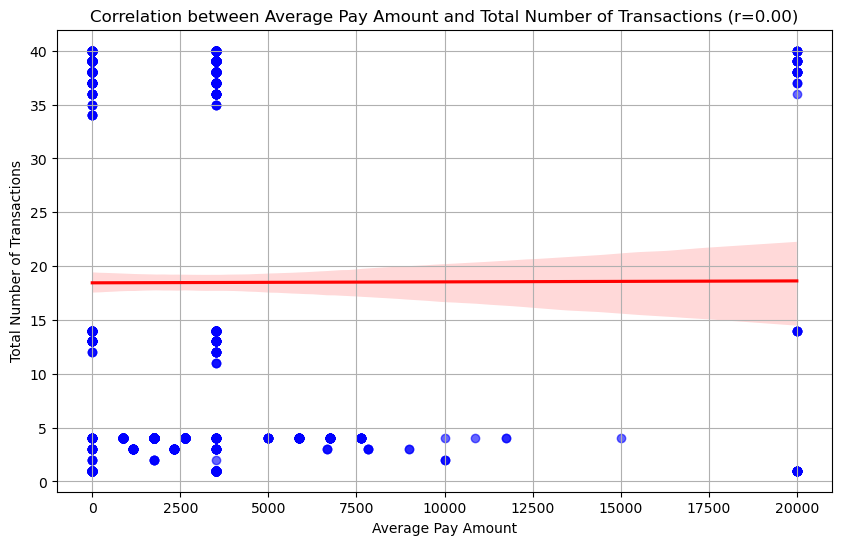

In [263]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Aggregate to get total transactions and average pay amount for each payCardID
student_df = df.groupby('payCardID').agg(
    total_number_of_Transactions=('transID', 'count'),  # Count of transactions
    average_payAmount=('payAmount', 'mean')  # Average of pay amounts
).reset_index()

# Set up the figure
plt.figure(figsize=(10, 6))

# Create a scatter plot with a regression line
sns.regplot(x='average_payAmount', y='total_number_of_Transactions', data=student_df, 
            scatter_kws={'alpha': 0.6, 'color': 'blue'}, 
            line_kws={'color': 'red'})

# Calculate and display the correlation coefficient
correlation = student_df['average_payAmount'].corr(student_df['total_number_of_Transactions'])
plt.title(f'Correlation between Average Pay Amount and Total Number of Transactions (r={correlation:.2f})')
plt.xlabel('Average Pay Amount')
plt.ylabel('Total Number of Transactions')

plt.grid(True)
plt.show()

In [85]:
df[(df['age_group'] == 'Student') & (df['dayOfWeek'].isin(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']))]

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,tapOutStopsLon,stopEndSeq,tapOutTime,payAmount,tapOutStatus,journeyTime,dayOfWeek,tapInHour,age,age_group
0,EIIW227B8L34VB,180062659848800,emoney,Bajragin Usada,M,2008,5,Matraman Baru - Ancol,1.0,P00142,...,106.85715,12.0,2023-04-03 06:00:53,3500.0,with_data,39.150000,Monday,5,16,Student
16,KLUN542I2F21PI,4532407180860336,dki,H. Lutfan Nurdiyanti,M,2011,S22,Ciputat - Kampung Rambutan,0.0,B05291P,...,106.75228,3.0,2023-04-03 07:07:17,3500.0,with_data,23.950000,Monday,6,13,Student
22,MEFW094B7A84RS,378872365541693,emoney,Aslijan Irawan,F,2009,T11,Poris Plawad - Bundaran Senayan,1.0,P00206,...,106.66501,24.0,2023-04-03 06:08:59,3500.0,with_data,55.850000,Monday,5,15,Student
27,BECP746A8C28NV,4968156435384914,dki,Martana Suartini,F,2007,11,Pulo Gebang - Matraman,0.0,P00233,...,106.86807,14.0,2023-04-03 06:33:42,3500.0,with_data,44.783333,Monday,5,17,Student
28,KYNP204W3G29VA,676367323901,flazz,Eluh Nugroho,F,2011,1C,Pesanggrahan - Blok M,0.0,B05833P,...,106.75969,5.0,2023-04-03 06:23:52,3500.0,with_data,23.550000,Monday,6,13,Student
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39309,FXQU521U1Q55XP,30378484061308,bni,"Surya Wibisono, S.T.",M,2007,6U,Blok M - Pasar Minggu,0.0,B01881P,...,106.83694,26.0,2023-04-19 19:08:29,3500.0,with_data,78.166667,Wednesday,17,17,Student
39326,DVXL591U4P06MT,3512921611736416,dki,drg. Harto Kusmawati,M,2009,3B,Rusun Flamboyan - Cengkareng,0.0,B06299P,...,106.72798,11.0,2023-04-05 17:05:04,0.0,with_data,44.866667,Wednesday,16,15,Student
39343,NGKF110P5X59PC,3537626290568235,dki,Cinta Megantara,M,2007,JAK.86,Term. Rawamangun - Term. Manggarai,1.0,B05776P,...,106.89099,26.0,2023-04-24 16:33:15,0.0,with_data,173.916667,Monday,13,17,Student
39346,SLKE078M5K56NO,6522272102888311,dki,Ifa Widiastuti,F,2006,7C,Cibubur - BKN,1.0,B00226P,...,106.89366,2.0,2023-04-19 10:27:34,3500.0,with_data,95.133333,Wednesday,8,18,Student


In [265]:
# Group by 'payCardName' and aggregate necessary information
summary_df = df[(df['age_group'] == 'Student') & (df['dayOfWeek'].isin(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'])) &  ((df['tapInTime'].dt.hour.between(5, 8)) | (df['tapInTime'].dt.hour.between(12, 16)))].groupby('payCardID').agg(
    payCardID=('payCardID', 'first'),
    Passenger=('payCardName', 'first'),
    age=('age', 'first'),
    age_group=('age_group', 'first'),
    payCardSex=('payCardSex', 'first'),
    payCardBank=('payCardBank', 'first'),
    total_number_of_Transactions=('payCardName', 'size'),  # Count of transactions
    Most_frequent_corridorName=('corridorName', lambda x: x.mode().iloc[0] if not x.mode().empty else None),
    Most_frequent_tapInStopsName=('tapInStopsName', lambda x: x.mode().iloc[0] if not x.mode().empty else None),
    Most_Frequent_tapOutStopsName=('tapOutStopsName', lambda x: x.mode().iloc[0] if not x.mode().empty else None),
    signup_date=('tapInTime', 'min'),  # First tapInTime for signup date
    last_active_date=('tapOutTime', 'max')  # Last tapOutTime for last active date
).reset_index(drop=True)

In [267]:
import folium
import numpy as np

# Define a function to segment passengers based on total transactions
def assign_segment(total_transactions):
    if total_transactions <= 10:
        return 'Bronze'
    elif total_transactions <= 30:
        return 'Silver'
    else:
        return 'Gold'

# Assign segments to each passenger in summary_df
summary_df['segment'] = summary_df['total_number_of_Transactions'].apply(assign_segment)

# Initialize the map centered on Jakarta
m = folium.Map(location=[-6.2, 106.8], zoom_start=12)

# Filter the dataframe by each segment
bronze_passengers = df[df['payCardID'].isin(summary_df[summary_df['segment'] == 'Bronze']['payCardID'])]
silver_passengers = df[df['payCardID'].isin(summary_df[summary_df['segment'] == 'Silver']['payCardID'])]
gold_passengers = df[df['payCardID'].isin(summary_df[summary_df['segment'] == 'Gold']['payCardID'])]
platinum_passengers = df[df['payCardID'].isin(summary_df[summary_df['segment'] == 'Platinum']['payCardID'])]

# Define colors and opacity for each segment outline
colors = {'Bronze': 'brown', 'Silver': 'grey', 'Gold': 'yellow', 'Platinum': 'blue'}
fill_color = 'black'
fill_opacity = 0.25

# Set the minimum and maximum circle size
min_size, max_size = 2, 10  # Adjusted for better visualization
tap_counts = df['tapInStops'].value_counts()

# Function to add circles with black fill and colored outline
def add_colored_circles(df, color, feature_group):
    for _, row in df.iterrows():
        # Scale circle size based on the count of tap-ins at this stop
        tap_count = tap_counts.get(row['tapInStops'], 1)  # Default to 1 if stop not found
        size = min_size + ((tap_count - tap_counts.min()) / (tap_counts.max() - tap_counts.min())) * (max_size - min_size)

        folium.CircleMarker(
            location=(row['tapInStopsLat'], row['tapInStopsLon']),
            radius=size,
            color=color,  # Colored outline
            fill=True,
            fill_opacity=fill_opacity,
            fill_color=color,
            weight=1  # Outline width
        ).add_to(feature_group)

# Create feature groups for each segment with colored outlines and add circles
bronze_group = folium.FeatureGroup(name='<span style="color:brown;">Bronze Passengers</span>', show=True)
silver_group = folium.FeatureGroup(name='<span style="color:grey;">Silver Passengers</span>', show=True)
gold_group = folium.FeatureGroup(name='<span style="color:yellow;">Gold Passengers</span>', show=True)
platinum_group = folium.FeatureGroup(name='<span style="color:blue;">Platinum Passengers</span>', show=True)

add_colored_circles(bronze_passengers, colors['Bronze'], bronze_group)
add_colored_circles(silver_passengers, colors['Silver'], silver_group)
add_colored_circles(gold_passengers, colors['Gold'], gold_group)
add_colored_circles(platinum_passengers, colors['Platinum'], platinum_group)

# Add feature groups to the map
m.add_child(bronze_group)
m.add_child(silver_group)
m.add_child(gold_group)
m.add_child(platinum_group)

# Add layer control to toggle visibility
folium.LayerControl(collapsed=False, position='topright').add_to(m)

# Add a legend with circle size explanation
legend_html = '''
<div style="
    position: fixed;
    bottom: 50px;
    left: 50px;
    width: 200px;
    height: 120px;
    background-color: white;
    border:2px solid grey;
    z-index: 1000;
    font-size: 14px;
    padding: 10px;">
    <h4>Circle Size Legend</h4>
    <i style="background: black; width: 10px; height: 10px; border-radius: 50%; display: inline-block;"></i> Smallest (Low Tap Count)<br>
    <i style="background: black; width: 20px; height: 20px; border-radius: 50%; display: inline-block;"></i> Largest (High Tap Count)
</div>
'''
m.get_root().html.add_child(folium.Element(legend_html))

# Display map
m

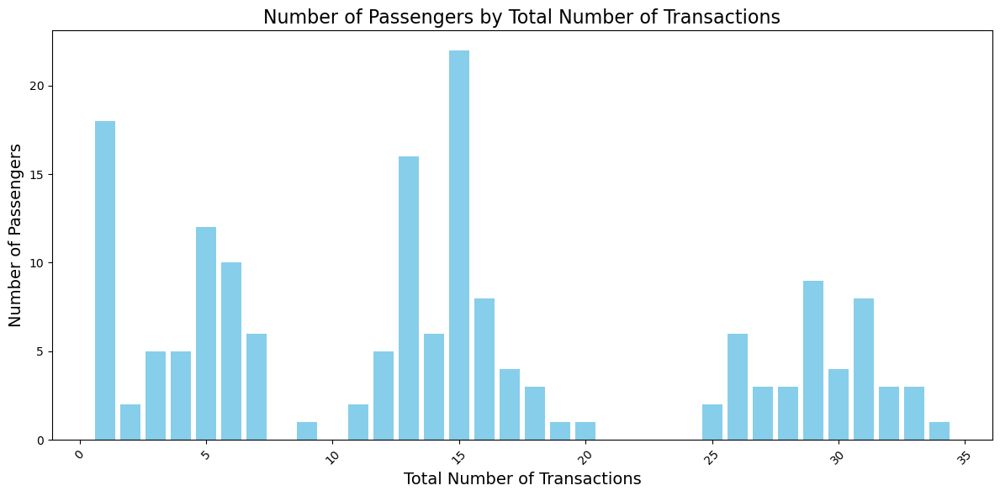

In [271]:
# Group by total_number_of_transactions and count the unique payCardName
transaction_counts = summary_df.groupby('total_number_of_Transactions')['payCardID'].nunique().reset_index()

# Rename the columns for clarity
transaction_counts.columns = ['Total Number of Transactions', 'Number of Passengers']

# Sort values by total_number_of_transactions for better visualization
transaction_counts = transaction_counts.sort_values(by='Total Number of Transactions')

# Create the bar chart
plt.figure(figsize=(12, 6))
plt.bar(transaction_counts['Total Number of Transactions'], transaction_counts['Number of Passengers'], color='skyblue')

# Add labels and title
plt.xlabel('Total Number of Transactions', fontsize=14)
plt.ylabel('Number of Passengers', fontsize=14)
plt.title('Number of Passengers by Total Number of Transactions', fontsize=16)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.tight_layout()  # Adjust layout

# Show the plot
plt.show()


In [273]:
# Filter the DataFrame for total_number_of_transactions greater than 40
filtered_df = summary_df[summary_df['total_number_of_Transactions'] > 21]

# Select only the necessary columns
result_df = filtered_df[['Passenger', 'total_number_of_Transactions']]

# Sort the result by total_number_of_transactions for better readability (optional)
result_df = result_df.sort_values(by='total_number_of_Transactions', ascending=False)

# Reset the index for better formatting (optional)
result_df.reset_index(drop=True, inplace=True)

# Display the result
print(result_df)

                     Passenger  total_number_of_Transactions
0           Daliono Adriansyah                            34
1    R.M. Langgeng Nashiruddin                            33
2             Pranata Wahyudin                            33
3     Tgk. Tania Zulaika, M.Pd                            33
4    Dt. Murti Salahudin, S.T.                            32
5         Gawati Damanik, S.E.                            32
6               Aslijan Irawan                            32
7             Estiawan Hastuti                            31
8      dr. Laswi Pranowo, S.Pd                            31
9        Danu Suartini, S.Farm                            31
10         Wawan Sudiati, S.IP                            31
11              Marsito Melani                            31
12        H. Lutfan Nurdiyanti                            31
13             Dalima Winarsih                            31
14               Zelda Laksita                            31
15                Tira S

C:\Users\Farrel\AppData\Local\Temp\ipykernel_21316\1192353462.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Farrel\AppData\Local\Temp\ipykernel_21316\1192353462.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



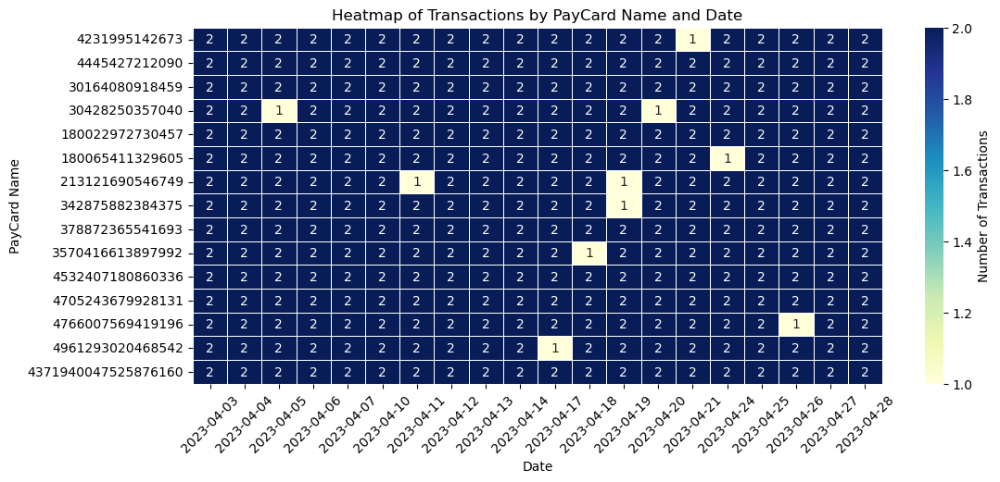

In [275]:
# Ensure tapInTime is in datetime format
df['tapInTime'] = pd.to_datetime(df['tapInTime'])

# Create a new column for the date
df['date'] = df['tapInTime'].dt.date

# Filter the DataFrame for payCardNames with more than 80 transactions
filtered_summary_df = summary_df[summary_df['total_number_of_Transactions'] > 30]
filtered_paycard_names = filtered_summary_df['payCardID'].unique()

# Aggregate the data: Count transactions for each payCardName and date
heatmap_data = df[df['payCardID'].isin(filtered_paycard_names)].groupby(['payCardID', 'date']).size().reset_index(name='number_of_transactions')

# Pivot the data for the heatmap using pivot_table
heatmap_pivot = heatmap_data.pivot_table(index='payCardID', columns='date', values='number_of_transactions', fill_value=0)

# Create the heatmap
plt.figure(figsize=(12, 5))
sns.heatmap(heatmap_pivot, cmap='YlGnBu', annot=True, fmt=".0f", linewidths=.5, cbar_kws={'label': 'Number of Transactions'})

# Set labels and title
plt.title('Heatmap of Transactions by PayCard Name and Date')
plt.xlabel('Date')
plt.ylabel('PayCard Name')
plt.xticks(rotation=45)
plt.yticks(rotation=0)

# Show the plot
plt.show()

In [277]:
df[df['payCardID'].isin(filtered_paycard_names)]

,transID,payCardID,payCardBank,payCardName,payCardSex,payCardBirthDate,corridorID,corridorName,direction,tapInStops,...,stopEndSeq,tapOutTime,payAmount,tapOutStatus,journeyTime,dayOfWeek,tapInHour,age,age_group,date
16,KLUN542I2F21PI,4532407180860336,dki,H. Lutfan Nurdiyanti,M,2011,S22,Ciputat - Kampung Rambutan,0.0,B05291P,...,3.0,2023-04-03 07:07:17,3500.0,with_data,23.950000,Monday,6,13,Student,2023-04-03
22,MEFW094B7A84RS,378872365541693,emoney,Aslijan Irawan,F,2009,T11,Poris Plawad - Bundaran Senayan,1.0,P00206,...,24.0,2023-04-03 06:08:59,3500.0,with_data,55.850000,Monday,5,15,Student,2023-04-03
58,IQBJ843C4G34DE,213121690546749,emoney,Pranata Wahyudin,F,2009,JAK.36,Cilangkap - Cililitan,0.0,B02638P,...,41.0,2023-04-03 06:39:16,0.0,with_data,41.200000,Monday,5,15,Student,2023-04-03
79,UCMI767D7M79GS,4766007569419196,dki,"Danu Suartini, S.Farm",M,2010,M3,Kalideres - Bundaran HI via Veteran,1.0,P00237,...,14.0,2023-04-03 07:21:09,3500.0,with_data,31.383333,Monday,6,14,Student,2023-04-03
86,JUNS207R4F95UA,180022972730457,emoney,"Tgk. Tania Zulaika, M.Pd",F,2010,M10,PGC 2 - Tanjung Priok,1.0,P00287,...,10.0,2023-04-03 06:47:17,3500.0,with_data,47.966667,Monday,5,14,Student,2023-04-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12431,EZUI793J9B10WA,30164080918459,bni,Daliono Adriansyah,F,2012,12,Tanjung Priok - Pluit,1.0,P00069,...,18.0,2023-04-28 17:53:09,3500.0,with_data,77.216667,Friday,16,12,Student,2023-04-28
12465,GFJM051Y2C80RM,4961293020468542,dki,"Wawan Sudiati, S.IP",F,2007,JAK.51,Taman Kota - Budi Luhur,1.0,B01195P,...,12.0,2023-04-28 18:24:23,0.0,with_data,85.250000,Friday,16,17,Student,2023-04-28
12491,OLUE394G4S94LY,4371940047525876160,brizzi,Zelda Laksita,M,2009,JAK.30,Grogol - Meruya via Roxy,0.0,B03969P,...,67.0,2023-04-28 17:05:57,0.0,with_data,62.866667,Friday,16,15,Student,2023-04-28
12527,SRMB596Y8K83FW,4445427212090,online,R.M. Langgeng Nashiruddin,F,2008,M4,Pulo Gadung 2 - Dukuh Atas 2,1.0,P00269,...,15.0,2023-04-28 18:29:23,3500.0,with_data,108.433333,Friday,16,16,Student,2023-04-28


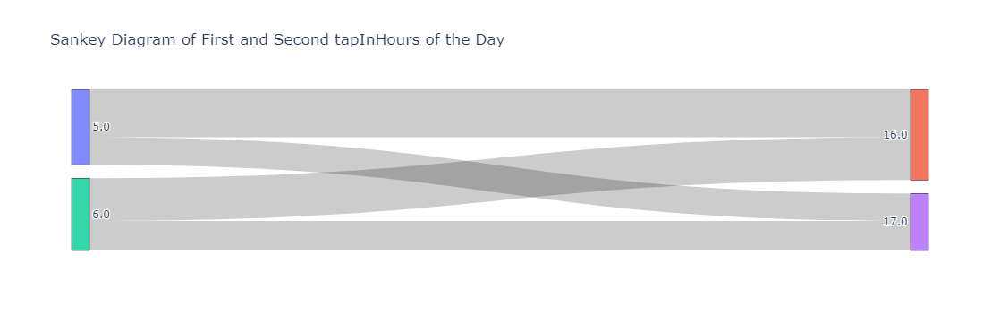

In [279]:
# Step 1: Filter payCardID with more than 30 transID
trans_count = df.groupby('payCardID').size()
filtered_ids = trans_count[trans_count > 1].index
# Combine both conditions into one filter
filtered_df = df[df['payCardID'].isin(filtered_paycard_names) & df['payCardID'].isin(filtered_ids)].copy()


# Step 2: Identify the first and second tapInHours for each payCardID on each day
filtered_df['tapInTime'] = pd.to_datetime(filtered_df['tapInTime'])
filtered_df['tapInDate'] = filtered_df['tapInTime'].dt.date
filtered_df['tapInHour'] = filtered_df['tapInTime'].dt.hour

# Sort by tapInTime to get sequential order of transactions
filtered_df = filtered_df.sort_values(['payCardID', 'tapInDate', 'tapInTime'])

# Add row number within each group to identify first and second tapInHour
filtered_df['tap_order'] = filtered_df.groupby(['payCardID', 'tapInDate']).cumcount()

# Keep only the first and second tapInHour of the day
first_second_hours = filtered_df[filtered_df['tap_order'].isin([0, 1])].pivot(
    index=['payCardID', 'tapInDate'], 
    columns='tap_order', 
    values='tapInHour'
).dropna()
first_second_hours.columns = ['first_tapInHour', 'second_tapInHour']

# Step 3: Prepare data for the Sankey diagram
# Get counts for each (first_tapInHour, second_tapInHour) combination
sankey_data = first_second_hours.value_counts().reset_index()
sankey_data.columns = ['first_tapInHour', 'second_tapInHour', 'count']

# Create nodes and links for Sankey
# Nodes are unique tapInHours for both first and second times
unique_hours = pd.unique(sankey_data[['first_tapInHour', 'second_tapInHour']].values.ravel())
hour_to_index = {hour: idx for idx, hour in enumerate(unique_hours)}

# Define nodes and links for Sankey
nodes = list(unique_hours)
source = sankey_data['first_tapInHour'].map(hour_to_index)
target = sankey_data['second_tapInHour'].map(hour_to_index)
value = sankey_data['count']

# Step 4: Create Sankey chart using Plotly
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=[str(hour) for hour in nodes]
    ),
    link=dict(
        source=source,
        target=target,
        value=value
    )
))

fig.update_layout(title_text="Sankey Diagram of First and Second tapInHours of the Day", font_size=12)
fig.show()

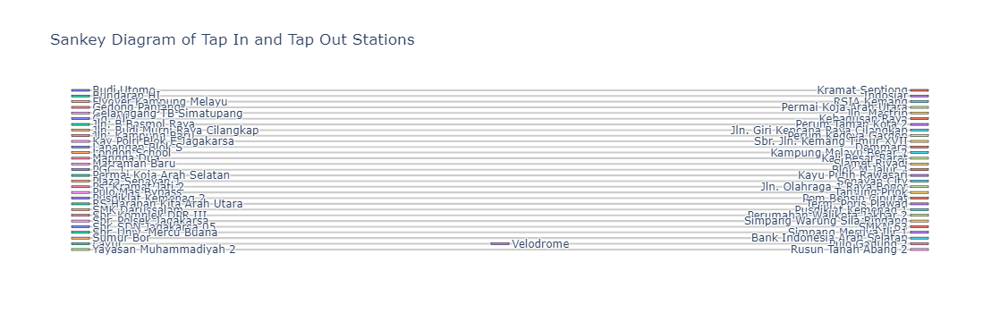

In [281]:
import pandas as pd
import plotly.graph_objects as go

# Step 1: Filter for passengers with more than 30 transID
trans_count = df.groupby('payCardID').size()
filtered_ids = trans_count[trans_count > 1].index
# Combine both conditions into one filter
filtered_df = df[df['payCardID'].isin(filtered_paycard_names) & df['payCardID'].isin(filtered_ids)].copy()

# Step 2: Remove rows where tapInStopsName or tapOutStopsName is missing
filtered_df = filtered_df.dropna(subset=['tapInStopsName', 'tapOutStopsName'])

# Step 3: Group by tapInStopsName and tapOutStopsName to get flow counts
station_flow = filtered_df.groupby(['tapInStopsName', 'tapOutStopsName']).size().reset_index(name='count')

# Step 4: Prepare data for Sankey diagram
# Nodes are unique station names from both tap-in and tap-out sides
unique_stations = pd.unique(station_flow[['tapInStopsName', 'tapOutStopsName']].values.ravel())
station_to_index = {station: idx for idx, station in enumerate(unique_stations)}

# Define nodes and links for Sankey
nodes = list(unique_stations)
source = station_flow['tapInStopsName'].map(station_to_index)
target = station_flow['tapOutStopsName'].map(station_to_index)
value = station_flow['count']

# Step 5: Create Sankey chart using Plotly
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=nodes
    ),
    link=dict(
        source=source,
        target=target,
        value=value
    )
))

fig.update_layout(title_text="Sankey Diagram of Tap In and Tap Out Stations", font_size=12)
fig.show()


## Total Number of Passengers by Age

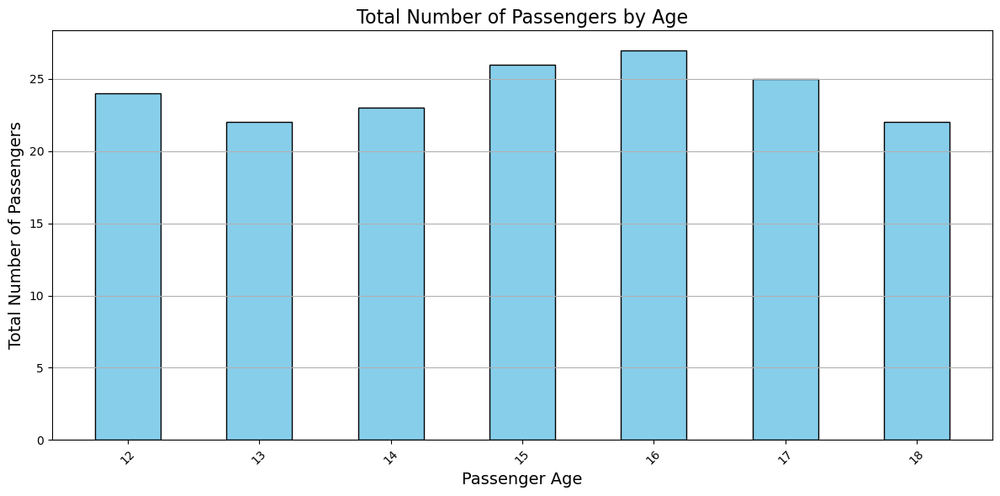

In [283]:
import matplotlib.pyplot as plt

# Group by age and count the number of passengers
age_counts = summary_df['age'].value_counts().sort_index()

# Create a thin bar chart
plt.figure(figsize=(12, 6))
plt.bar(age_counts.index, age_counts.values, width=0.5, color='skyblue', edgecolor='black')

# Set the title and labels
plt.title('Total Number of Passengers by Age', fontsize=16)
plt.xlabel('Passenger Age', fontsize=14)
plt.ylabel('Total Number of Passengers', fontsize=14)

# Optionally, rotate the x-ticks for better visibility
plt.xticks(rotation=45)

# Show the grid for better readability
plt.grid(axis='y')

# Display the bar chart
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>

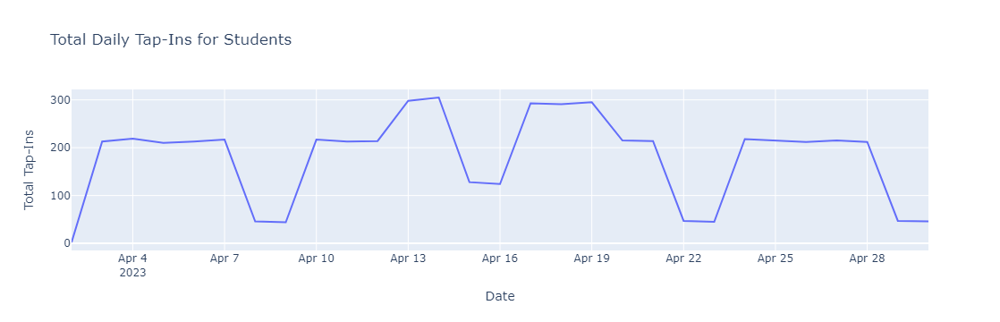

In [157]:
# Filter for students
student_df = df[df['age_group'] == 'Student']

# Group by date
daily_tap_ins = student_df.groupby(student_df['tapInTime'].dt.date).size().reset_index(name='tapInCount')

# Plot
fig = px.line(daily_tap_ins, x='tapInTime', y='tapInCount', title='Total Daily Tap-Ins for Students')
fig.update_xaxes(title='Date')
fig.update_yaxes(title='Total Tap-Ins')
fig.show()

<IPython.core.display.Javascript object>

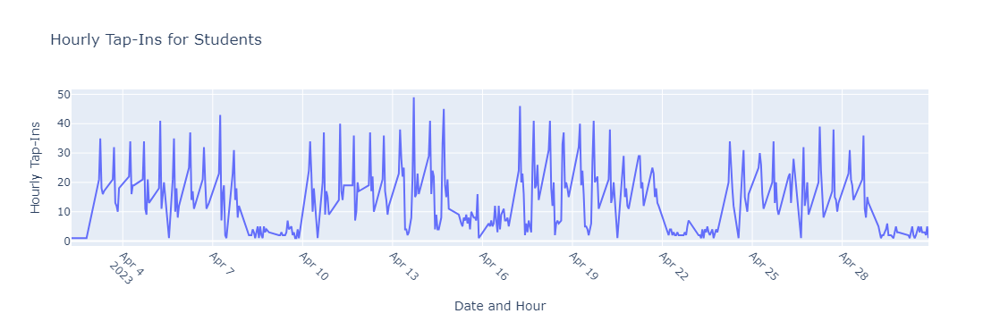

In [159]:
# Group by date and hour
hourly_tap_ins = student_df.groupby([student_df['tapInTime'].dt.date, student_df['tapInHour']]).size().reset_index(name='tapInCount')

# Convert columns to strings for better handling on x-axis
hourly_tap_ins['tapInTime'] = hourly_tap_ins['tapInTime'].astype(str) + ' ' + hourly_tap_ins['tapInHour'].astype(str) + ':00'

# Plot
fig = px.line(hourly_tap_ins, x='tapInTime', y='tapInCount', title='Hourly Tap-Ins for Students')
fig.update_xaxes(title='Date and Hour', tickangle=45)
fig.update_yaxes(title='Hourly Tap-Ins')
fig.show()


In [31]:
student_df = student_df[(student_df['tapInTime'].dt.hour.between(5, 9)) | (student_df['tapInTime'].dt.hour.between(16, 18))]

In [248]:
# Top 10 tap-in stops
top_tapIn_stops = student_df['tapInStopsName'].value_counts().head(30).reset_index()
top_tapIn_stops.columns = ['tapInStopsName', 'Count']

# Top 10 tap-out stops
top_tapOut_stops = student_df['tapOutStopsName'].value_counts().head(30).reset_index()
top_tapOut_stops.columns = ['tapOutStopsName', 'Count']

# Combine into a single table
top_stops = pd.DataFrame({
    'Top Tap-In Stops': top_tapIn_stops['tapInStopsName'],
    'Tap-In Count': top_tapIn_stops['Count'],
    'Top Tap-Out Stops': top_tapOut_stops['tapOutStopsName'],
    'Tap-Out Count': top_tapOut_stops['Count']
})

top_stops


,Top Tap-In Stops,Tap-In Count,Top Tap-Out Stops,Tap-Out Count
0,Pancoran Tugu Arah Barat,63,Monas,94
1,Budi Utomo,59,Penjaringan,84
2,Dukuh Atas,55,Pantai Maju,82
3,Rawa Selatan,49,Bundaran HI,55
4,Penggilingan,46,Blok M Jalur 2,47
5,Gold Coast,44,Pademangan,44
6,Rusun Marunda 1,44,Rawa Buaya,40
7,Sumur Bor,40,Perumnas Klender,40
8,Gedong Panjang,40,Tanjung Priok,40
9,Flyover Klender,40,Bank Indonesia Arah Selatan,40


In [250]:
# Calculate the unique count of passengers who tapped in at each stop
top_10_tap_in_stops = student_df.groupby('tapInStopsName')['payCardName'].nunique().nlargest(10).reset_index()
top_10_tap_in_stops.columns = ['Tap In Stop Name', 'Unique Passenger Count']

# Calculate the unique count of passengers who tapped out at each stop
top_10_tap_out_stops = student_df.groupby('tapOutStopsName')['payCardName'].nunique().nlargest(10).reset_index()
top_10_tap_out_stops.columns = ['Tap Out Stop Name', 'Unique Passenger Count']

# Display the tables
print("Top 10 Stops with Most Unique Passengers Who Tapped In")
print(top_10_tap_in_stops)

print("\nTop 10 Stops with Most Unique Passengers Who Tapped Out")
print(top_10_tap_out_stops)


Top 10 Stops with Most Unique Passengers Who Tapped In
           Tap In Stop Name  Unique Passenger Count
0          Cibubur Junction                       3
1            Gedong Panjang                       3
2            Jembatan Merah                       3
3        Jln. Kwitang Timur                       3
4  Pancoran Tugu Arah Barat                       3
5               Pantai Maju                       3
6               Penjaringan                       3
7                  RS Islam                       3
8              Rawa Selatan                       3
9              Balai Kota 1                       2

Top 10 Stops with Most Unique Passengers Who Tapped Out
        Tap Out Stop Name  Unique Passenger Count
0             Penjaringan                       7
1          Blok M Jalur 2                       4
2             Lebak Bulus                       4
3  Term. Kampung Rambutan                       4
4         Kejaksaan Agung                       3
5            MH 

In [252]:
# Calculate the unique count of passengers in corridor
top_10_unique_corridor = student_df.groupby('corridorName')['payCardName'].nunique().nlargest(10).reset_index()
top_10_unique_corridor.columns = ['Corridor Name', 'Unique Passenger Count']

# Calculate the count of passengers in corridor
top_corridor = student_df['corridorName'].value_counts().head(10).reset_index()
top_corridor.columns = ['corridorName', 'Count']

# Display the tables
print("Top 10 most unique corridor")
print(top_10_unique_corridor)

print("\nTop 10 most popular corridor")
print(top_corridor)


Top 10 most unique corridor
                         Corridor Name  Unique Passenger Count
0  Kalideres - Bundaran HI via Veteran                       6
1                 Pinang Ranti - Pluit                       5
2                        Blok M - Kota                       4
3                        Cibubur - BKN                       4
4           JIS - Terminal Muara Angke                       4
5         Kampung Melayu - Duren Sawit                       4
6         Kampung Melayu - Tanah Abang                       4
7  Lebak Bulus - Pasar Baru via Tomang                       4
8                Lebak Bulus - Ragunan                       4
9                Matraman Baru - Ancol                       4

Top 10 most popular corridor
                          corridorName  Count
0  Kalideres - Bundaran HI via Veteran    171
1                 Pinang Ranti - Pluit    151
2                  Pulo Gadung - Monas    118
3           Monas - Pantai Indah Kapuk    112
4                 C

In [254]:
# 4. Map Visualization of Popular Routes
# Get the 20 most popular tap-ins
top_10_tap_ins = student_df['tapInStopsName'].value_counts().head(10).index
map_data = student_df[student_df['tapInStopsName'].isin(top_10_tap_ins)]

# Initialize Folium map centered around Jakarta
map = folium.Map(location=[-6.2, 106.8], zoom_start=11)

# Add markers for each tap-in and tap-out stop
for _, row in map_data.iterrows():
    tap_in_marker = folium.Marker(
        location=[row['tapInStopsLat'], row['tapInStopsLon']],
        popup=f"Tap-In: {row['tapInStopsName']} ({row['corridorName']})",
        icon=folium.Icon(color="blue", icon="info-sign")
    ).add_to(map)
    tap_out_marker = folium.Marker(
        location=[row['tapOutStopsLat'], row['tapOutStopsLon']],
        popup=f"Tap-Out: {row['tapOutStopsName']} ({row['corridorName']})",
        icon=folium.Icon(color="red", icon="info-sign")
    ).add_to(map)
    
    # Draw line between tap-in and tap-out
    PolyLine(locations=[[row['tapInStopsLat'], row['tapInStopsLon']], 
                        [row['tapOutStopsLat'], row['tapOutStopsLon']]],
             color='blue', weight=2.5, opacity=1).add_to(map)

map  # Display map

Total number of tap-ins: 39467
     Month  Number of Tap-ins
0  2023-04              39467


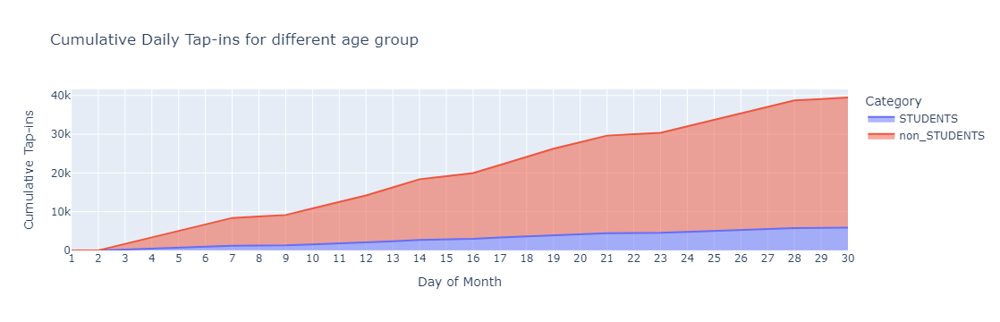

In [146]:
# Create a new column to classify STUDENTS
df['age'] = 2024 - df['payCardBirthDate']  # Assuming current year is 2024
df['is_student'] = df['age'] < 19

# 1a. Total number of tap-ins
total_tap_ins = df['tapInStops'].count()
print(f'Total number of tap-ins: {total_tap_ins}')

# 1b. Table showing number of tap-ins by month
df['month'] = df['tapInTime'].dt.to_period('M')  # Create a 'month' column
monthly_tap_ins = df.groupby('month')['tapInStops'].count().reset_index()
monthly_tap_ins.columns = ['Month', 'Number of Tap-ins']
print(monthly_tap_ins)

# 1c. Stacked area chart showing cumulative daily tap-ins for STUDENTS and non-STUDENTS
# Create a DataFrame for tap-ins by day
df['day'] = df['tapInTime'].dt.date  # Extract the date part for daily aggregation

# Aggregate the tap-ins by day and by student status
daily_tap_ins = df.groupby(['day', 'is_student'])['tapInStops'].count().unstack(fill_value=0)
daily_tap_ins.columns = ['non_STUDENTS', 'STUDENTS']

# Prepare the cumulative data
cumulative_data = daily_tap_ins.cumsum().reset_index()

# Convert 'day' back to a datetime object for Plotly
cumulative_data['day'] = pd.to_datetime(cumulative_data['day'])

# Melt the DataFrame for Plotly
melted_data = cumulative_data.melt(id_vars=['day'], value_vars=['STUDENTS', 'non_STUDENTS'], 
                                     var_name='Category', value_name='Cumulative Tap-ins')

# Plot the stacked area chart using Plotly
fig = px.area(melted_data, x='day', y='Cumulative Tap-ins', 
              color='Category', 
              labels={'Cumulative Tap-ins': 'Cumulative Tap-ins'},
              title='Cumulative Daily Tap-ins for different age group')

# Update layout for better visibility
fig.update_layout(xaxis_title='Day of Month',
                  yaxis_title='Cumulative Tap-ins',
                  xaxis_tickformat='%d',  # Show only the day
                  xaxis=dict(tickvals=cumulative_data['day'], ticktext=[d.day for d in cumulative_data['day']]),
                  legend_title_text='Category')

# Show the figure
fig.show()

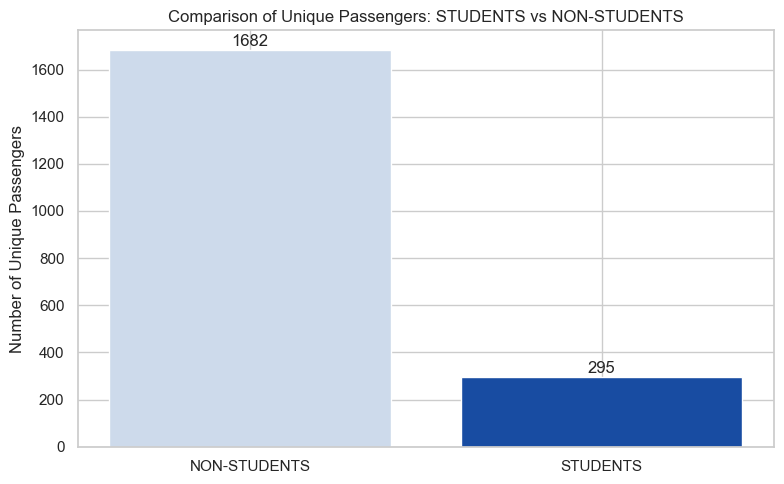

In [148]:
unique_student_counts = df.groupby('is_student')['payCardID'].nunique()

# Prepare data for plotting
categories = ['NON-STUDENTS', 'STUDENTS']
counts = [unique_student_counts.get(False, 0), unique_student_counts.get(True, 0)]

# Define colors using RGB
colors = [(205/255, 218/255, 235/255), (24/255, 76/255, 162/255)]  # Normalized RGB

# Create a bar chart
plt.figure(figsize=(8, 5))
bars = plt.bar(categories, counts, color=colors)

# Adding data labels to the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval + 5, 
             int(yval), ha='center', va='bottom')

# Add title and labels
plt.title('Comparison of Unique Passengers: STUDENTS vs NON-STUDENTS')
plt.ylabel('Number of Unique Passengers')
plt.xticks(rotation=0)

# Show the plot
plt.tight_layout()
plt.show()


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

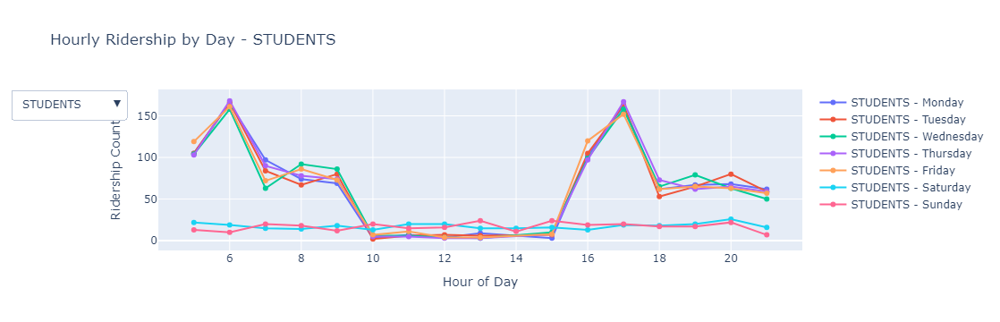

In [150]:
# Create a list of unique days for the dropdown
days_of_week = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Group data for all passengers
all_hourly_ridership = df.groupby(['dayOfWeek', 'tapInHour']).size().reset_index(name='ridership_count')

# Filter the DataFrame for STUDENTS
students_df = df[df['is_student'] == True]  # Change 'is_student' to the appropriate column name
# Group data by hour of the day and day of the week for STUDENTS
student_hourly_ridership = students_df.groupby(['dayOfWeek', 'tapInHour']).size().reset_index(name='ridership_count')

# Create a Plotly figure
fig = go.Figure()

# Add lines for all passengers
for day in days_of_week:
    day_data = all_hourly_ridership[all_hourly_ridership['dayOfWeek'] == day]
    fig.add_trace(go.Scatter(
        x=day_data['tapInHour'],
        y=day_data['ridership_count'],
        mode='lines+markers',
        name=f'All Passengers - {day}',
        visible='legendonly',  # Set initial visibility to legend only
        line=dict(width=2)
    ))

# Add lines for STUDENTS
for day in days_of_week:
    day_data = student_hourly_ridership[student_hourly_ridership['dayOfWeek'] == day]
    fig.add_trace(go.Scatter(
        x=day_data['tapInHour'],
        y=day_data['ridership_count'],
        mode='lines+markers',
        name=f'STUDENTS - {day}',
        line=dict(width=2)
    ))

# Update layout with dropdown for data filter
fig.update_layout(
    title="Hourly Ridership by Day",
    xaxis_title="Hour of Day",
    yaxis_title="Ridership Count",
    updatemenus=[
        {
            'buttons': [
                {
                    'label': 'All Passengers',
                    'method': 'update',
                    'args': [{'visible': [True if 'All Passengers' in trace.name else False for trace in fig.data]},
                              {'title': 'Hourly Ridership by Day - All Passengers'}]
                },
                {
                    'label': 'STUDENTS',
                    'method': 'update',
                    'args': [{'visible': [True if 'STUDENTS' in trace.name else False for trace in fig.data]},
                              {'title': 'Hourly Ridership by Day - STUDENTS'}]
                }
            ],
            'direction': 'down',
            'showactive': True,
        }
    ]
)

# Show the figure
fig.show()

In [170]:
# Create a new column for tapInTime in HH:MM:SS format
df['tapInhhmmss'] = df['tapInTime'].dt.strftime('%H:%M:%S')

# Define the time ranges
time_bins = [
    '00:00:00', '01:00:00', '02:00:00', '03:00:00', '04:00:00', 
    '05:00:00', '06:00:00', '07:00:00', '08:00:00', '09:00:00', 
    '10:00:00', '11:00:00', '12:00:00', '13:00:00', '14:00:00', 
    '15:00:00', '16:00:00', '17:00:00', '18:00:00', '19:00:00', 
    '20:00:00', '21:00:00', '22:00:00'
]

# Create a new column to categorize tapInTime into time ranges
df['time_range'] = pd.cut(
    df['tapInTime'].dt.hour + df['tapInTime'].dt.minute / 60,  # Convert to hours
    bins=np.arange(0, 25),  # 0 to 24
    labels=[f"{str(i).zfill(2)}:00 - {str(i).zfill(2)}:59" for i in range(24)],
    right=False
)

# Filter for STUDENTS and weekdays
weekdays = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday"]
students_df = df[(df['dayOfWeek'].isin(weekdays)) & (df['is_student'] == True)].copy()  # Change 'is_student' to the appropriate column name

# Convert tapInTime to total seconds for calculations
students_df.loc[:, 'tapInSeconds'] = students_df['tapInTime'].dt.hour * 3600 + students_df['tapInTime'].dt.minute * 60 + students_df['tapInTime'].dt.second

# Group by time range and calculate total count, mean, and median in seconds
summary_table = students_df.groupby('time_range').agg(
    total_students=('tapInTime', 'count'),
    mean_time=('tapInSeconds', 'mean'),
    median_time=('tapInSeconds', 'median')
).reset_index()

# Handle potential NaN values in mean_time and median_time
summary_table['mean_time'] = summary_table['mean_time'].fillna(0)  # Replace NaNs with 0 for calculations
summary_table['median_time'] = summary_table['median_time'].fillna(0)  # Replace NaNs with 0 for calculations

# Convert mean_time and median_time back to HH:MM:SS format
summary_table['mean_time'] = pd.to_timedelta(summary_table['mean_time'], unit='s').dt.components.apply(lambda x: f"{int(x['hours']):02}:{int(x['minutes']):02}:{int(x['seconds']):02}", axis=1)
summary_table['median_time'] = pd.to_timedelta(summary_table['median_time'], unit='s').dt.components.apply(lambda x: f"{int(x['hours']):02}:{int(x['minutes']):02}:{int(x['seconds']):02}", axis=1)

# Sort the table by time range
summary_table = summary_table.sort_values(by='time_range')

# Display the summary table
print(summary_table)

       time_range  total_students mean_time median_time
0   00:00 - 00:59               0  00:00:00    00:00:00
1   01:00 - 01:59               0  00:00:00    00:00:00
2   02:00 - 02:59               0  00:00:00    00:00:00
3   03:00 - 03:59               0  00:00:00    00:00:00
4   04:00 - 04:59               0  00:00:00    00:00:00
5   05:00 - 05:59             536  05:29:50    05:29:55
6   06:00 - 06:59             818  06:30:06    06:30:50
7   07:00 - 07:59             406  07:29:23    07:30:41
8   08:00 - 08:59             397  08:30:56    08:31:12
9   09:00 - 09:59             382  09:29:30    09:29:05
10  10:00 - 10:59              23  10:33:51    10:43:16
11  11:00 - 11:59              35  11:30:17    11:34:14
12  12:00 - 12:59              22  12:24:06    12:21:15
13  13:00 - 13:59              25  13:25:45    13:24:21
14  14:00 - 14:59               0  00:00:00    00:00:00
15  15:00 - 15:59              36  15:31:10    15:32:16
16  16:00 - 16:59             523  16:29:59    1

C:\Users\Farrel\AppData\Local\Temp\ipykernel_17956\1147748366.py:29: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



C:\Users\Farrel\anaconda3\Lib\site-packages\joypy\joyplot.py:176: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

C:\Users\Farrel\anaconda3\Lib\site-packages\joypy\joyplot.py:238: UserWarning:

At least a column/group has no numeric values.



<Figure size 1200x800 with 0 Axes>

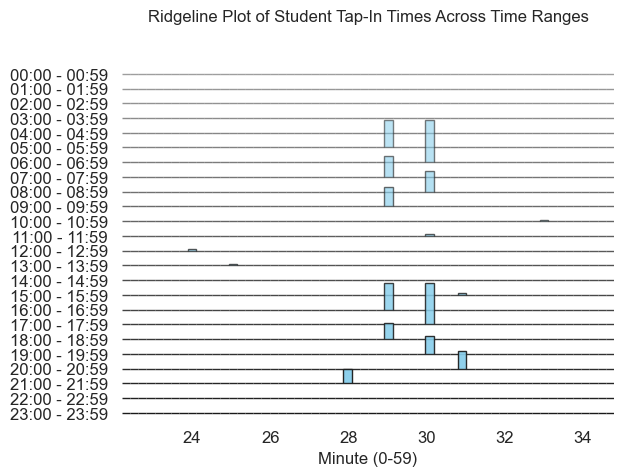

In [168]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from joypy import joyplot

# Ensure that 'summary_table' is prepared correctly
# You can uncomment the following code if you need to redefine it

# summary_table = # Your previously defined summary table

# Extracting minute from mean_time for X-axis
summary_table['minute'] = pd.to_timedelta(summary_table['mean_time']).dt.seconds // 60 % 60

# Prepare the data for the plot
# Duplicate rows for each student count to use hist=True in joyplot (simulate instances)
plot_data = pd.DataFrame({
    'minute': np.repeat(summary_table['minute'], summary_table['total_students']),
    'time_range': np.repeat(summary_table['time_range'], summary_table['total_students'])
})

# Set up the joyplot
plt.figure(figsize=(12, 8))
joyplot(
    data=plot_data,
    by='time_range',
    column='minute',
    color="skyblue",
    fade=True,
    range_style='own',
    hist=True,
    bins=60,  # Minute resolution for histogram
    overlap=0.5,
    title='Ridgeline Plot of Student Tap-In Times Across Time Ranges'
)

# Add labels and show the plot
plt.xlabel("Minute (0-59)")
plt.ylabel("Time Range")
plt.show()

### 3.1. Demographic Comparison

In [299]:
import plotly.graph_objects as go
df['corridorCategory'] = df['corridorCategory'].fillna('Others')
# Filter to only include records with multiple tapOutStopsName for each tapInStopsName
df_filtered = df[df.duplicated(['tapInStopsName', 'tapOutStopsName'], keep=False)]

# Creating lists for the Sankey diagram data
sources = df_filtered['tapInStopsName']
targets = df_filtered['tapOutStopsName']
categories = df_filtered['corridorCategory']

# Encode unique stops and assign colors to each corridorCategory
unique_stops = list(set(sources) | set(targets))
stop_mapping = {stop: idx for idx, stop in enumerate(unique_stops)}
source_indices = sources.map(stop_mapping)
target_indices = targets.map(stop_mapping)

# Assign colors based on corridorCategory
corridor_colors = {
    'BRT': 'rgba(31, 119, 180, 0.8)',
    'Royaltrans': 'rgba(255, 127, 14, 0.8)',
    'Angkutan Penumpang': 'rgba(44, 160, 44, 0.8)',
    'Transjabodetabek': 'rgba(214, 39, 40, 0.8)',
    'Mikrotrans': 'rgba(148, 103, 189, 0.8)',
    'Tidak Beroperasi': 'rgba(140, 86, 75, 0.8)',
    'Layanan AMARI': 'rgba(227, 119, 194, 0.8)',
    'Rumah Susun': 'rgba(188, 189, 34, 0.8)',
}

# Mapping colors to each link based on corridorCategory
link_colors = [corridor_colors[cat] for cat in categories]

# Create Sankey diagram with color-coded links based on corridorCategory
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=unique_stops,
    ),
    link=dict(
        source=source_indices,
        target=target_indices,
        value=[1] * len(source_indices),
        color=link_colors
    )
))

fig.update_layout(
        title_text="Transjakarta Passenger Flow by Corridor Category",
        font_size=10, 
        height = 900)
fig.show()


KeyError: 'Others'

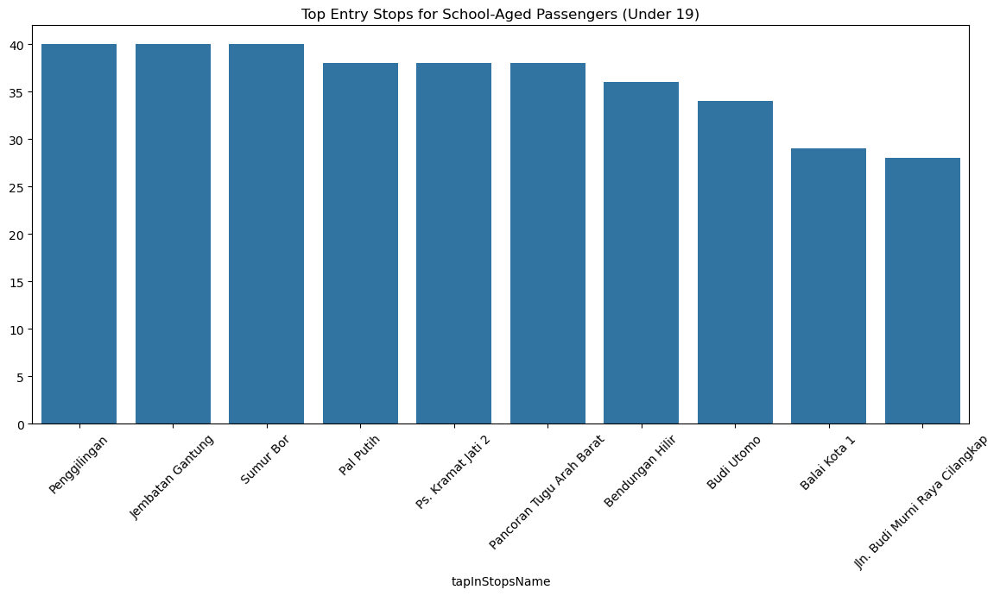

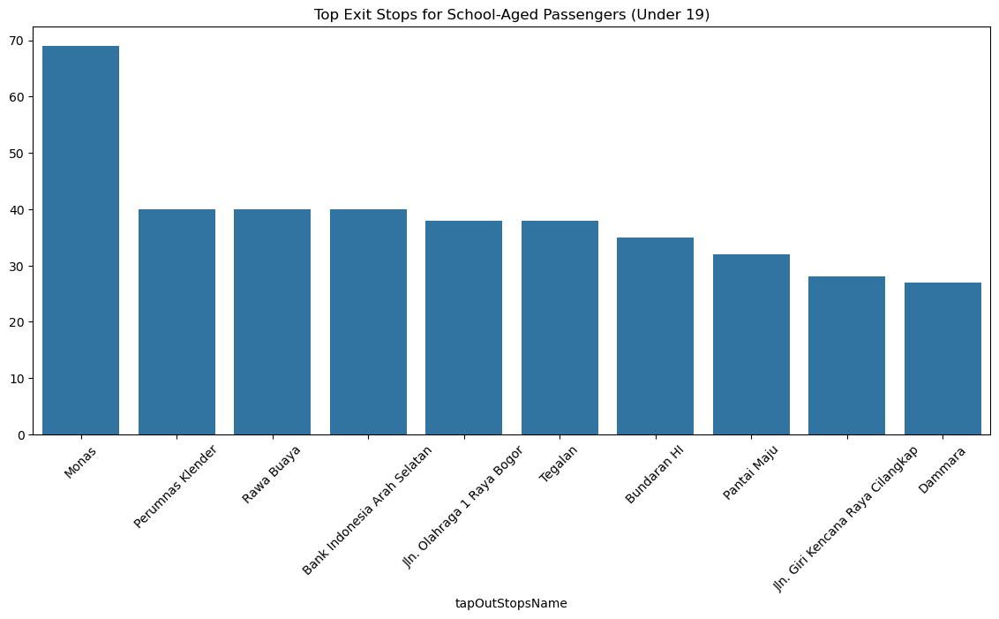

In [64]:
# Calculate key points: Popular entry and exit stops for passengers under 19 in target hours
key_points = pd.concat([morning_shift, afternoon_shift])
top_stops_in = key_points['tapInStopsName'].value_counts().head(10)
top_stops_out = key_points['tapOutStopsName'].value_counts().head(10)

# Visualize top entry and exit stops
plt.figure(figsize=(14, 6))
sns.barplot(x=top_stops_in.index, y=top_stops_in.values)
plt.title('Top Entry Stops for School-Aged Passengers (Under 19)')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(14, 6))
sns.barplot(x=top_stops_out.index, y=top_stops_out.values)
plt.title('Top Exit Stops for School-Aged Passengers (Under 19)')
plt.xticks(rotation=45)
plt.show()

In [128]:
# Count occurrences of each pair (tapInStopsName to tapOutStopsName)
sankey_data = df_under_19.groupby(['tapInStopsName', 'tapOutStopsName']).size().reset_index(name='count')

# Prepare the data for the Sankey diagram
source = sankey_data['tapInStopsName']
target = sankey_data['tapOutStopsName']
counts = sankey_data['count']

# Create node labels and indices for source and target nodes
all_nodes = pd.concat([source, target]).unique()
node_labels = list(all_nodes)

source_indices = source.apply(lambda x: node_labels.index(x))
target_indices = target.apply(lambda x: node_labels.index(x))

# Define Sankey diagram
sankey_figure = go.Figure(data=[go.Sankey(
    node=dict(
        pad=15,
        thickness=20,
        line=dict(color="black", width=0.5),
        label=node_labels,
        color="blue"
    ),
    link=dict(
        source=source_indices,  # indices of tapInStopsName in node_labels
        target=target_indices,  # indices of tapOutStopsName in node_labels
        value=counts
    )
)])

# Set up layout
sankey_figure.update_layout(title_text="Transjakarta Passenger Flow: Tap-In to Tap-Out for Passengers Under 19", font_size=12)

sankey_figure.show()

NameError: name 'df_under_19' is not defined

In [66]:
# Plot geographic heatmap of popular stops
def plot_heatmap(data, lat_col, lon_col, label_col, value_col, title):
    map_center = [data[lat_col].mean(), data[lon_col].mean()]
    heatmap_map = folium.Map(location=map_center, zoom_start=12)
    for _, row in data.iterrows():
        folium.CircleMarker(
            location=[row[lat_col], row[lon_col]],
            radius=row[value_col] * 0.01,
            popup=row[label_col],
            color='blue',
            fill=True,
            fill_color='blue'
        ).add_to(heatmap_map)
    return heatmap_map

In [68]:
# Create data for mapping
entry_map_data = key_points.groupby(['tapInStopsName', 'tapInStopsLat', 'tapInStopsLon']).size().reset_index(name='count')
exit_map_data = key_points.groupby(['tapOutStopsName', 'tapOutStopsLat', 'tapOutStopsLon']).size().reset_index(name='count')

# Plot the maps
entry_heatmap = plot_heatmap(entry_map_data, 'tapInStopsLat', 'tapInStopsLon', 'tapInStopsName', 'count', 'Top Entry Stops Heatmap')
exit_heatmap = plot_heatmap(exit_map_data, 'tapOutStopsLat', 'tapOutStopsLon', 'tapOutStopsName', 'count', 'Top Exit Stops Heatmap')

entry_heatmap.save('entry_heatmap.html')
exit_heatmap.save('exit_heatmap.html')

print("Demographic analysis and visualizations are ready. Heatmaps saved as HTML files.")

Demographic analysis and visualizations are ready. Heatmaps saved as HTML files.


In [ ]:
heatmap_map)
    return heatmap_map

# Create data for

In [425]:
import pandas as pd

# Assume 'df' is already loaded with the relevant columns

# Convert birth year to age
df['payCardAge'] = 2024 - df['payCardBirthDate']

# Group by customer information and aggregate trip frequency and total money spent
df_customer = df.groupby(['payCardID', 'payCardBank', 'payCardName', 'payCardSex', 'payCardAge']).agg(
    frequency_of_trips=('transID', 'count'),  # Count of transactions per customer
    total_money_spent=('payAmount', 'sum')    # Total money spent per customer
).reset_index()

# Display the resulting DataFrame
df_customer


,payCardID,payCardBank,payCardName,payCardSex,payCardAge,frequency_of_trips,total_money_spent
0,60403675436,flazz,Dr. Taufan Jailani,F,35,40,140000.0
1,60404498697,flazz,Sutan Imam Nasyidah,M,35,40,0.0
2,60417020934,flazz,Hardana Nashiruddin,F,59,4,3500.0
3,60421208343,flazz,Natalia Hakim,M,21,4,23500.0
4,60427539402,flazz,"Lanang Firmansyah, M.Farm",F,41,1,3500.0
...,...,...,...,...,...,...,...
1995,4980316891349967240,brizzi,"dr. Nadine Lestari, M.M.",M,30,4,3500.0
1996,4980564692107508708,brizzi,"Drs. Yessi Wulandari, M.Farm",M,16,14,49000.0
1997,4986663118222525457,brizzi,Yahya Narpati,F,14,40,0.0
1998,4995586292967989635,brizzi,"Tgk. Gandi Nashiruddin, S.IP",M,31,5,14000.0


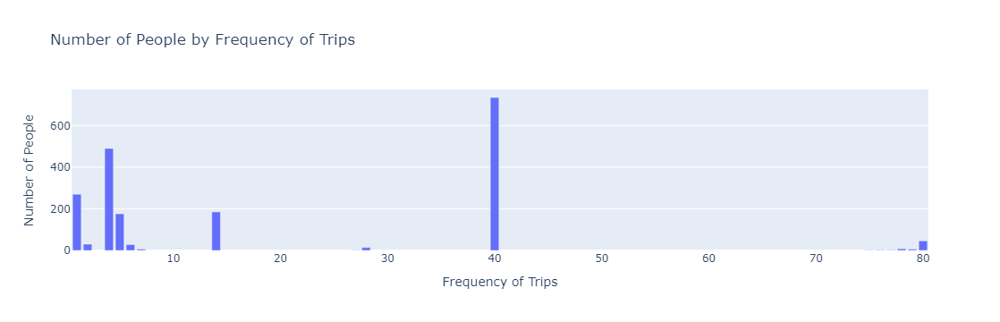

In [429]:
import plotly.express as px

# Calculate the number of people per trip frequency
frequency_counts = df_customer['frequency_of_trips'].value_counts().reset_index()
frequency_counts.columns = ['frequency_of_trips', 'number_of_people']

# Plot the bar chart
fig = px.bar(
    frequency_counts,
    x='frequency_of_trips',
    y='number_of_people',
    title="Number of People by Frequency of Trips",
    labels={'frequency_of_trips': 'Frequency of Trips', 'number_of_people': 'Number of People'}
)

# Display the bar chart
fig.show()


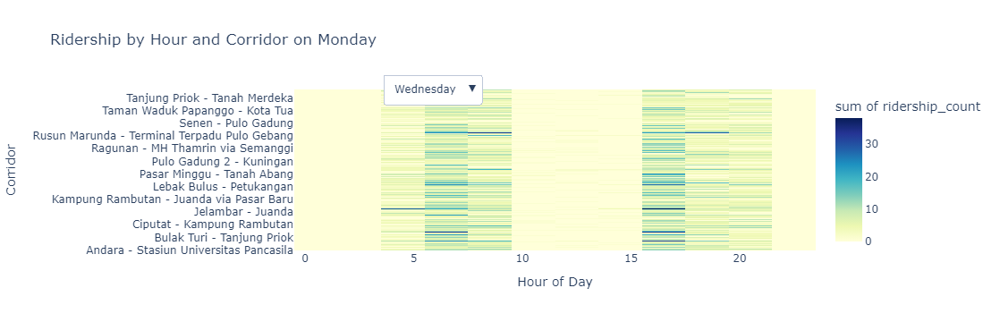

TypeError: generate_heatmap() takes 1 positional argument but 3 were given

In [213]:
import pandas as pd
import plotly.express as px

# Sample DataFrame setup (replace this with your actual data)
# Assuming df has been preloaded with columns 'corridorName', 'dayOfWeek', 'hourOfDay', and ridership data

# Group data by corridor name, day of the week, and hour of the day
grouped_data = df.groupby(['corridorName', 'dayOfWeek', 'hourOfDay']).size().reset_index(name='ridership_count')

# Create a complete grid of corridor names, days, and hours
corridors = grouped_data['corridorName'].unique()
days = grouped_data['dayOfWeek'].unique()

# Create all combinations of corridors, days, and hours
complete_grid = pd.MultiIndex.from_product(
    [corridors, days, range(24)], 
    names=['corridorName', 'dayOfWeek', 'hourOfDay']
).to_frame(index=False)

# Merge with the grouped data to fill missing hours with 0
complete_data = pd.merge(complete_grid, grouped_data, on=['corridorName', 'dayOfWeek', 'hourOfDay'], how='left')
complete_data['ridership_count'] = complete_data['ridership_count'].fillna(0)

# Function to generate heatmap for a specific day
def generate_heatmap(day):
    data = complete_data[complete_data['dayOfWeek'] == day]
    fig = px.density_heatmap(
        data, 
        x='hourOfDay', 
        y='corridorName', 
        z='ridership_count', 
        color_continuous_scale='YlGnBu',
        title=f"Ridership by Hour and Corridor on {day}",
        height=900 
    )
    fig.update_layout(xaxis_title="Hour of Day", yaxis_title="Corridor")
    return fig

# Initial day to display
initial_day = 'Monday'
fig = generate_heatmap(initial_day)

# Ordered list of days
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Add dropdown for day filter
fig.update_layout(
    updatemenus=[dict(
        buttons=[dict(
            args=[{"x": [complete_data[complete_data['dayOfWeek'] == day]['hourOfDay']],
                       "y": [complete_data[complete_data['dayOfWeek'] == day]['corridorName']],
                       "z": [complete_data[complete_data['dayOfWeek'] == day]['ridership_count']]}],
            label=day,
            method="restyle"
        )
        for day in ordered_days],
        direction="down",
        pad={"r": 10, "t": 10},
        showactive=True,
        x=0.17,
        xanchor="left",
        y=1.15,
        yanchor="top"
    )]
)

fig.show()


# Calculate overall min and max for ridership_count
overall_min = complete_data['ridership_count'].min()
overall_max = complete_data['ridership_count'].max()

# Initial day to display
initial_day = 'Monday'
fig = generate_heatmap(initial_day, overall_min, overall_max)

# Ordered list of days
ordered_days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Add dropdown for day filter
fig.update_layout(
    updatemenus=[dict(
        buttons=[dict(
            args=[{"x": [complete_data[complete_data['dayOfWeek'] == day]['hourOfDay']],
                       "y": [complete_data[complete_data['dayOfWeek'] == day]['corridorName']],
                       "z": [complete_data[complete_data['dayOfWeek'] == day]['ridership_count']]}],
            label=day,
            method="restyle"
        )
        for day in ordered_days],
        direction="down",
        pad={"r": 10, "t": 10},
        showactive=True,
        x=0.17,
        xanchor="left",
        y=1.15,
        yanchor="top"
    )]
)

fig.show()


# EDA 1a. Top 20 most crowded corridors averaged from Monday to Friday, including the specific time of day when each corridor is most crowded

In [215]:
import pandas as pd

# Assuming complete_data DataFrame is already created as shown earlier
# Filter for weekdays (Monday to Friday)
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
weekday_data = complete_data[complete_data['dayOfWeek'].isin(weekdays)]

# Group by corridorName and hourOfDay, calculating the average ridership
average_ridership = weekday_data.groupby(['corridorName', 'hourOfDay'])['ridership_count'].mean().reset_index()

# Find the hour with maximum average ridership for each corridor
max_ridership = average_ridership.loc[average_ridership.groupby('corridorName')['ridership_count'].idxmax()]

# Rename columns for clarity
max_ridership = max_ridership.rename(columns={'ridership_count': 'Average ridership on weekdays', 'hourOfDay': 'Time of day'})

# Rank the corridors based on the maximum average ridership
max_ridership['Rank'] = max_ridership['Average ridership on weekdays'].rank(method='min', ascending=False).astype(int)

# Sort by average ridership and select top 20
top_20_corridors = max_ridership.sort_values(by='Average ridership on weekdays', ascending=False).head(20)

# Display the result
top_20_corridors[['Rank', 'corridorName', 'Average ridership on weekdays', 'Time of day']]


,Rank,corridorName,Average ridership on weekdays,Time of day
2801,1,Pulo Gadung - Monas,23.8,17
1337,2,Kalideres - Bundaran HI via Veteran,23.2,17
305,3,Blok M - Kota,21.6,17
3774,4,Rusun Pondok Bambu - Walikota Jakarta Timur,20.4,6
592,5,Cilangkap - Cililitan,19.2,16
2118,6,Matraman Baru - Ancol,14.4,6
2177,7,Monas - Pantai Indah Kapuk,14.0,17
1758,8,Kampung Rambutan - Pondok Gede,13.2,6
521,9,Cibubur - Balai Kota,13.0,17
2465,10,Pasar Minggu - Tanah Abang,12.8,17


# EDA 2. Hourly Ridership by day
As shown on the chart, weekdays ridership could go from just below 400 to slightly above 1.000 passengers during rush hour. Rush hour is defined as hours 5-9 AM and 4-8 PM.
Ridership on weekend is at steady 100.

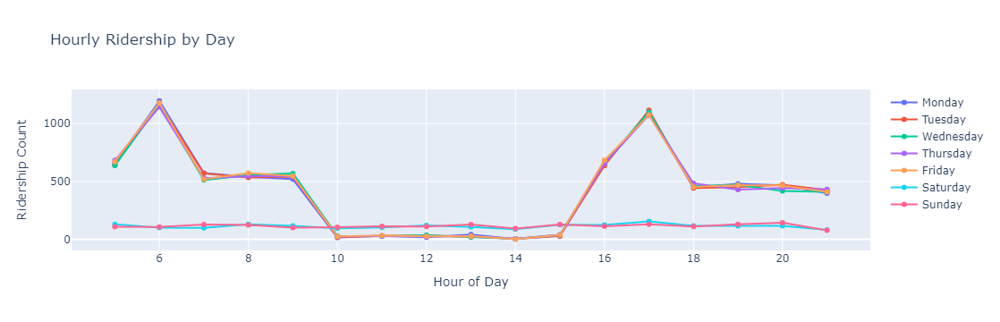

In [217]:
import pandas as pd
import plotly.graph_objs as go
import plotly.express as px

# Sample DataFrame setup (replace this with your actual data)
# Assuming df has been preloaded with columns 'corridorName', 'dayOfWeek', 'hourOfDay', and ridership data

# Group data by hour of the day and day of the week to get total ridership
hourly_ridership = df.groupby(['dayOfWeek', 'hourOfDay']).size().reset_index(name='ridership_count')

# Create a list of unique days for the dropdown
days_of_week = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Create a Plotly figure
fig = go.Figure()

# Add lines for each day with different opacity based on filtering
for day in days_of_week:
    day_data = hourly_ridership[hourly_ridership['dayOfWeek'] == day]
    fig.add_trace(go.Scatter(
        x=day_data['hourOfDay'],
        y=day_data['ridership_count'],
        mode='lines+markers',
        name=day,
        opacity=1,  # Full opacity initially
        line=dict(width=2)
    ))

# Update layout with dropdown for day filter
fig.update_layout(
    title="Hourly Ridership by Day",
    xaxis_title="Hour of Day",
    yaxis_title="Ridership Count",
 
)

# Adjusting the visibility of traces based on selection
for idx, trace in enumerate(fig.data):
    trace.visible = True  # Ensure all traces are initially visible

fig.show()


# EDA 3. Number of unique users by day of week

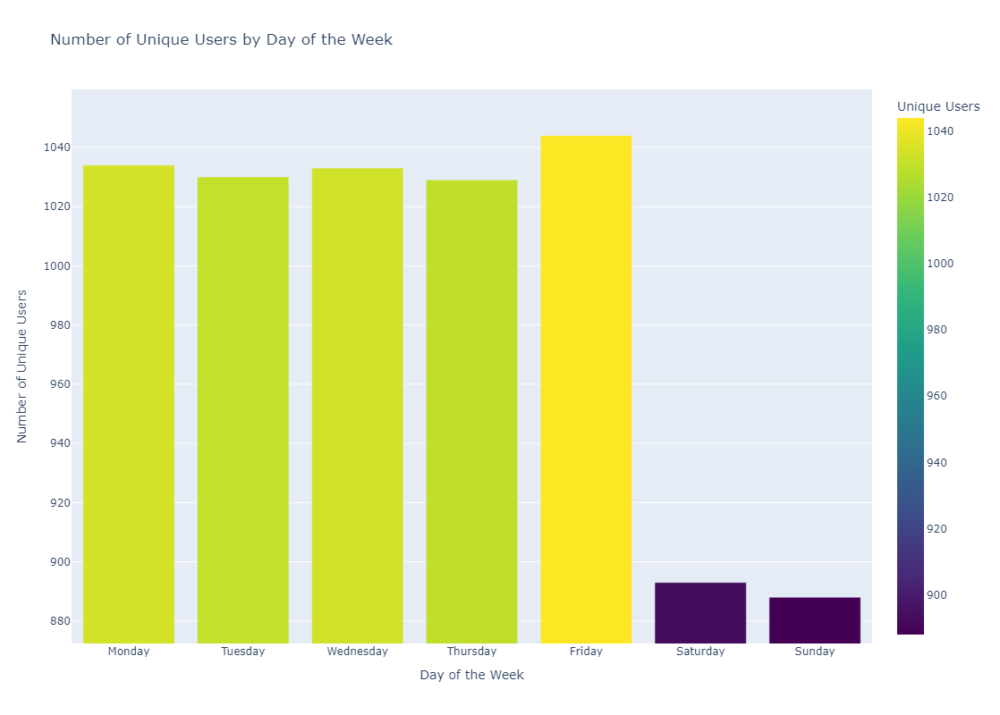

In [219]:
# Calculate the number of unique users (payCardName) for each day of the week
unique_users_by_day = df.groupby('dayOfWeek')['payCardName'].nunique().reset_index(name='unique_users')

# Define the order of days
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Convert 'dayOfWeek' to a categorical type with the specified order
unique_users_by_day['dayOfWeek'] = pd.Categorical(unique_users_by_day['dayOfWeek'], categories=days_order, ordered=True)

# Sort the DataFrame by dayOfWeek
unique_users_by_day = unique_users_by_day.sort_values('dayOfWeek')

# Calculate min and max unique users
min_users = unique_users_by_day['unique_users'].min()
max_users = unique_users_by_day['unique_users'].max()

# Define the ideal padding value (10% of the range)
ideal_padding = 0.1 * (max_users - min_users)

# Set the Y-axis range
yaxis_range = [min_users - ideal_padding, max_users + ideal_padding]

# Create the bar chart
fig = px.bar(unique_users_by_day, 
             x='dayOfWeek', 
             y='unique_users',
             width=1000, 
             height=800, 
             title='Number of Unique Users by Day of the Week',
             labels={'unique_users': 'Unique Users', 'dayOfWeek': 'Day of the Week'},
             color='unique_users',
             color_continuous_scale='Viridis')

# Update layout for better aesthetics
fig.update_layout(
    xaxis_title='Day of the Week', 
    yaxis_title='Number of Unique Users',
    yaxis=dict(range=yaxis_range)  # Set Y-axis range dynamically
)

# Show the figure
fig.show()

# EDA 2b. Weekly Unique Passenger

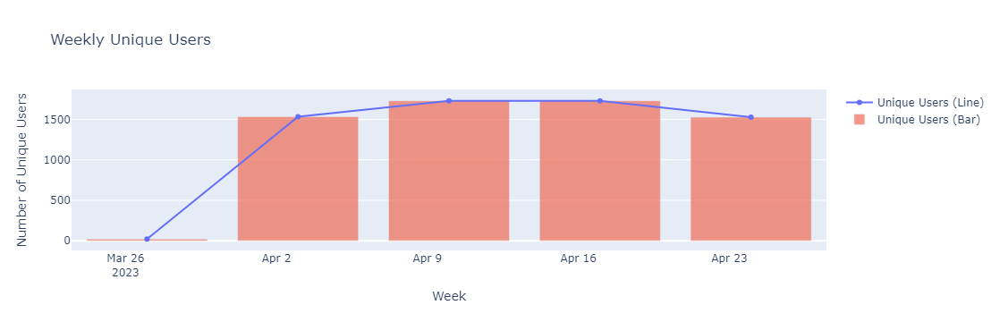

In [221]:
import pandas as pd
import plotly.graph_objects as go

# Convert 'tapInTime' to datetime if it's not already in datetime format
df['tapInTime'] = pd.to_datetime(df['tapInTime'])

# Create a new column for the week of each tap-in (using the start of the week)
df['week'] = df['tapInTime'].dt.to_period('W').dt.start_time

# Count the number of unique users per week
weekly_unique_users = df.groupby('week')['payCardID'].nunique().reset_index()
weekly_unique_users = weekly_unique_users.rename(columns={'payCardID': 'unique_users'})

# Create a line and bar chart in one figure
fig = go.Figure()

# Add line chart
fig.add_trace(
    go.Scatter(
        x=weekly_unique_users['week'],
        y=weekly_unique_users['unique_users'],
        mode='lines+markers',
        name='Unique Users (Line)'
    )
)

# Add bar chart
fig.add_trace(
    go.Bar(
        x=weekly_unique_users['week'],
        y=weekly_unique_users['unique_users'],
        name='Unique Users (Bar)',
        opacity=0.6
    )
)

# Customize the layout
fig.update_layout(
    title="Weekly Unique Users",
    xaxis_title="Week",
    yaxis_title="Number of Unique Users",
    barmode='overlay'  # Allows the bar and line to overlay
)

fig.show()


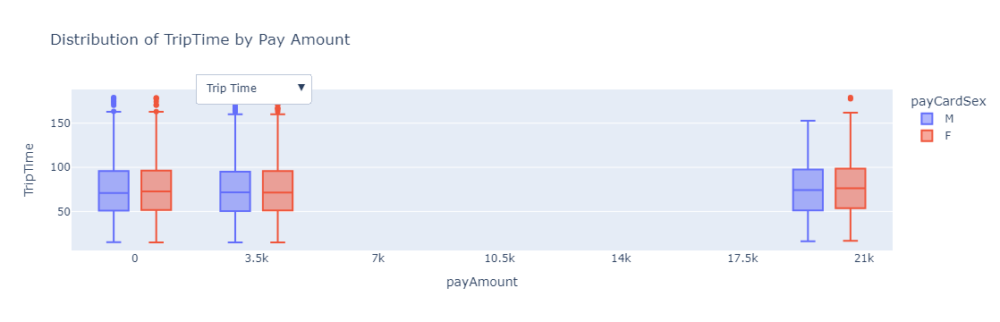

In [223]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go

# Convert 'tapInTime' and 'tapOutTime' to datetime if they're not already in datetime format
df['tapInTime'] = pd.to_datetime(df['tapInTime'])
df['tapOutTime'] = pd.to_datetime(df['tapOutTime'])

# Calculate TripTime in minutes
df['TripTime'] = (df['tapOutTime'] - df['tapInTime']).dt.total_seconds() / 60  # Convert to minutes

# Calculate age
df['age'] = 2024 - df['payCardBirthDate']

# Create a box plot function with a filter for Y-axis
def create_box_plot(y_variable):
    fig = px.box(
        df,
        x='payAmount',
        y=y_variable,
        height = 900,
        color='payCardSex',  # Optional: color by sex
        title=f'Distribution of {y_variable} by Pay Amount',
        category_orders={'payAmount': [0, 3500, 20000]}  # Set custom order for payAmount
    )
    return fig

# Initialize with the first variable
initial_y_variable = 'TripTime'
fig = create_box_plot(initial_y_variable)

# Update layout to include dropdown for variable selection
fig.update_layout(
    updatemenus=[
        {
            'buttons': [
                {
                    'label': 'Trip Time',
                    'method': 'update',
                    'args': [{'y': [df['TripTime']]}, {'title': 'Distribution of Trip Time by Pay Amount'}]
                },
                {
                    'label': 'Age',
                    'method': 'update',
                    'args': [{'y': [df['age']]}, {'title': 'Distribution of Age by Pay Amount'}]
                },
                {
                    'label': 'Pay Card Bank',
                    'method': 'update',
                    'args': [{'y': [df['payCardBank']]}, {'title': 'Distribution of Pay Card Bank by Pay Amount'}]
                },
            ],
            'direction': 'down',
            'showactive': True,
            'x': 0.15,
            'xanchor': 'left',
            'y': 1.1,
            'yanchor': 'top'
        }
    ]
)

# Show the figure
fig.show()


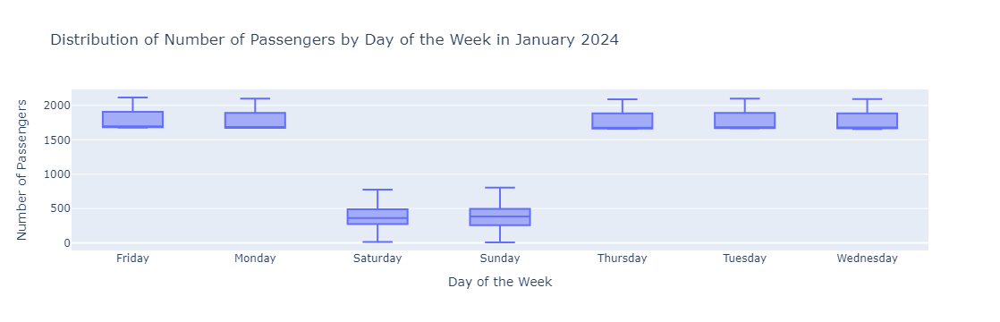

In [341]:
import pandas as pd
import plotly.express as px

# Sample DataFrame setup (replace this with your actual data)
# Assuming df has been preloaded with relevant columns

# Convert 'tapInTime' to datetime if it's not already
df['tapInTime'] = pd.to_datetime(df['tapInTime'])


# Create a new column for the day of the week
df['day_of_week'] = df['tapInTime'].dt.day_name()

# Group by the day of the week and date to count the number of unique passengers (transactions)
daily_counts = df.groupby(['day_of_week', df['tapInTime'].dt.date])['transID'].count().reset_index(name='number_of_passengers')

# Order days of the week
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
daily_counts['day_of_week'] = pd.Categorical(daily_counts['day_of_week'], categories=day_order, ordered=True)

# Create the box plot
fig = px.box(daily_counts, x='day_of_week', y='number_of_passengers',
             title='Distribution of Number of Passengers by Day of the Week in January 2024',
             labels={'number_of_passengers': 'Number of Passengers', 'day_of_week': 'Day of the Week'})

# Show the plot
fig.show()


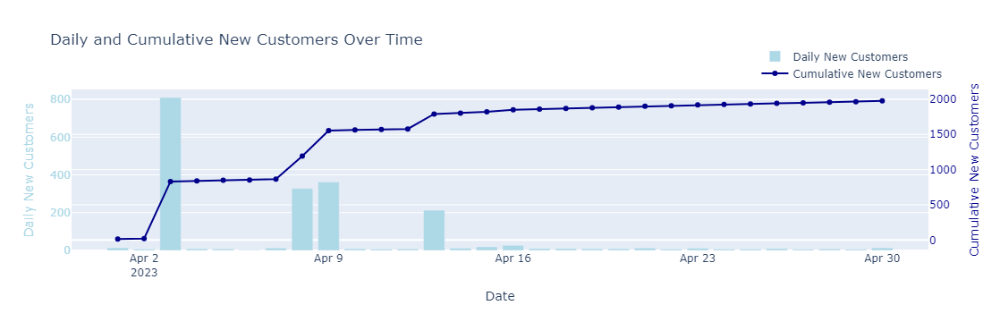

In [333]:
import pandas as pd
import plotly.graph_objects as go

# Sample data setup (assuming df is preloaded)
# Convert tapInTime to date only, discarding time
df['tapInDate'] = pd.to_datetime(df['tapInTime']).dt.date

# Identify first usage date per customer
first_tap_dates = df.groupby('payCardID')['tapInDate'].min().reset_index()
first_tap_dates = first_tap_dates.rename(columns={'tapInDate': 'first_tap_date'})

# Count new customers for each day by aggregating the first tap dates
daily_new_customers = first_tap_dates.groupby('first_tap_date').size().reset_index(name='new_customers')

# Calculate cumulative new customers
daily_new_customers['cumulative_customers'] = daily_new_customers['new_customers'].cumsum()

# Create dual-axis chart with Plotly
fig = go.Figure()

# Add bar chart for daily new customers
fig.add_trace(go.Bar(
    x=daily_new_customers['first_tap_date'],
    y=daily_new_customers['new_customers'],
    name="Daily New Customers",
    marker_color='lightblue',
    yaxis='y1'
))

# Add line chart for cumulative new customers
fig.add_trace(go.Scatter(
    x=daily_new_customers['first_tap_date'],
    y=daily_new_customers['cumulative_customers'],
    mode='lines+markers',
    name="Cumulative New Customers",
    line=dict(color='darkblue', width=2),
    yaxis='y2'
))

# Update layout for dual y-axes
fig.update_layout(
    title="Daily and Cumulative New Customers Over Time",
    xaxis=dict(title="Date"),
    yaxis=dict(
        title="Daily New Customers",
        titlefont=dict(color="lightblue"),
        tickfont=dict(color="lightblue")
    ),
    yaxis2=dict(
        title="Cumulative New Customers",
        titlefont=dict(color="darkblue"),
        tickfont=dict(color="darkblue"),
        overlaying='y',
        side='right'
    ),
    legend=dict(x=0.8, y=10),
    bargap=0.2
)

fig.show()


In [327]:
import pandas as pd
import plotly.express as px

# Sample DataFrame setup (replace this with your actual data)
# Assuming df has been preloaded with relevant columns

# Convert 'tapInTime' to datetime if it's not already
df['tapInTime'] = pd.to_datetime(df['tapInTime'])

# Create a new column for the day of the week
df['day_of_week'] = df['tapInTime'].dt.day_name()

# Group by payCardName and day_of_week to count rides
ride_counts = df.groupby(['payCardName', 'day_of_week']).size().reset_index(name='ride_frequency')

# Filter for weekday riders
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday']
weekday_riders = ride_counts[ride_counts['day_of_week'].isin(weekdays)]

# Get exclusive weekday riders
exclusive_weekday_riders = weekday_riders.groupby('payCardName').filter(lambda x: len(x) == 5)  # 5 weekdays

# Get the first tap-in date for each passenger
exclusive_weekday_riders['first_ride_date'] = exclusive_weekday_riders.groupby('payCardName')['tapInTime'].transform('min')

# Create a cohort table with retention counts
cohort_data = exclusive_weekday_riders.copy()
cohort_data['tapInDate'] = cohort_data['tapInTime'].dt.date

# Create a retention matrix
cohort_data['cohort'] = cohort_data['first_ride_date'].dt.date
cohort_data['days_since_first_ride'] = (cohort_data['tapInDate'] - cohort_data['cohort']).dt.days

# Count unique riders for each cohort and retention period
retention_matrix = cohort_data.groupby(['cohort', 'days_since_first_ride'])['payCardName'].nunique().reset_index()

# Pivot the retention matrix for visualization
retention_pivot = retention_matrix.pivot(index='cohort', columns='days_since_first_ride', values='payCardName').fillna(0)

# Convert to percentage
retention_pivot = retention_pivot.div(retention_pivot.sum(axis=1), axis=0) * 100

# Create a heatmap of the retention rates
fig = px.imshow(
    retention_pivot,
    labels=dict(x="Days Since First Ride", y="Cohort", color="Retention (%)"),
    x=retention_pivot.columns,
    y=retention_pivot.index,
    color_continuous_scale='Blues',
    title='Passenger Retention for Exclusive Weekday Riders'
)

fig.update_xaxes(title_text='Days Since First Ride')
fig.update_yaxes(title_text='Cohort Start Date')
fig.show()


KeyError: 'Column not found: tapInTime'

In [431]:
# Extract hour and day of week
df['tapInHour'] = df['tapInTime'].dt.hour
df['tapInDayOfWeek'] = df['tapInTime'].dt.dayofweek

# Calculate passenger age
df['age'] = 2024 - df['payCardBirthDate']

# Filter passengers based on criteria
filtered_passengers = df[
    (df['tapInHour'].between(5, 7)) &  # Tap in between 5-7 AM
    (df['age'] <= 18) &                # Age 18 or under
    (df['tapInDayOfWeek'] < 5)         # Weekdays only
]

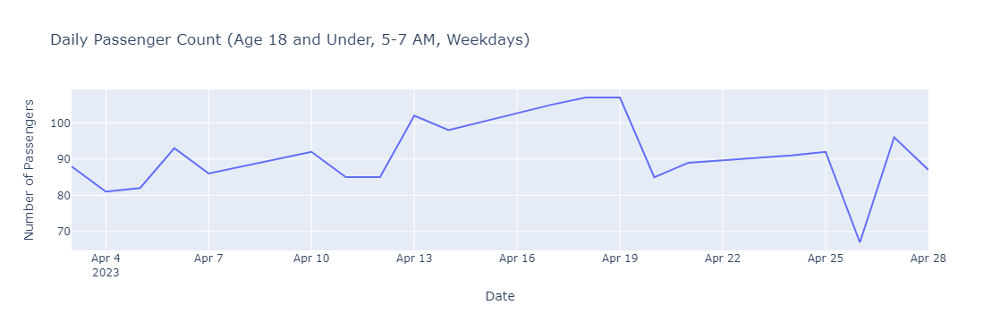

In [433]:
# Group by date to get the count of passengers each day
time_series_data = filtered_passengers.groupby(filtered_passengers['tapInTime'].dt.date).size().reset_index(name='num_passengers')

# Plot time series (line plot)
import plotly.express as px

fig = px.line(time_series_data, x='tapInTime', y='num_passengers', title='Daily Passenger Count (Age 18 and Under, 5-7 AM, Weekdays)')
fig.update_xaxes(title='Date')
fig.update_yaxes(title='Number of Passengers')
fig.show()


In [435]:
top_5_tapin_stops = filtered_passengers['tapInStopsName'].value_counts().nlargest(5).reset_index()
top_5_tapin_stops.columns = ['tapInStopsName', 'count']
print(top_5_tapin_stops)


      tapInStopsName  count
0          Pal Putih     40
1          Sumur Bor     40
2   Jembatan Gantung     40
3  Ps. Kramat Jati 2     40
4       Penggilingan     40


In [443]:
# Count the number of unique passengers for each TapInStopsName in the filtered dataset
unique_passenger_count = filtered_passengers.groupby('tapInStopsName')['payCardID'].nunique().reset_index()

# Rename columns for clarity
unique_passenger_count.columns = ['tapInStopsName', 'Number of Unique Passengers']

# Sort by 'Number of Unique Passengers' in descending order
unique_passenger_count = unique_passenger_count.sort_values(by='Number of Unique Passengers', ascending=False).reset_index(drop=True)

# Display the resulting table
unique_passenger_count


,tapInStopsName,Number of Unique Passengers
0,Rawa Selatan,3
1,Balai Kota 1,2
2,Petojo,2
3,Velbak,2
4,Pancoran Tugu Arah Barat,2
...,...,...
140,Kel. Susukan,1
141,Kementerian Pariwisata,1
142,Komplek Pertokoan Cempaka Putih,1
143,Kuningan Madya,1


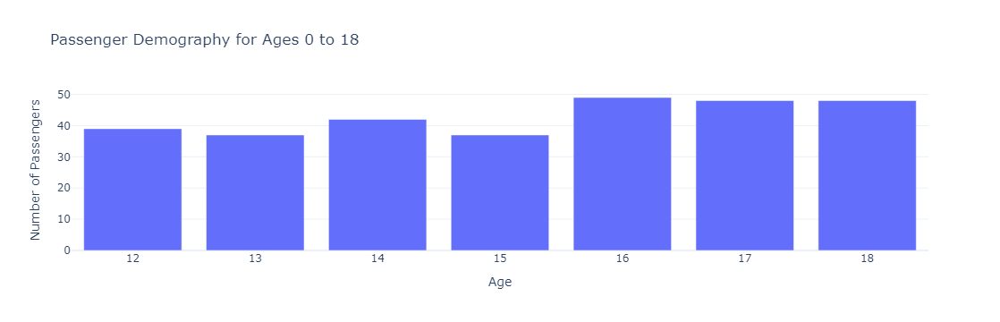

In [445]:
import plotly.express as px

# Filter dataset for passengers aged 0 to 18
age_filtered = df_customer[(df_customer['payCardAge'] >= 0) & (df_customer['payCardAge'] <= 18)]

# Group by age and count the number of passengers at each age
age_demography = age_filtered.groupby('payCardAge').size().reset_index(name='Number of Passengers')

# Create the bar chart
fig = px.bar(
    age_demography,
    x='payCardAge',
    y='Number of Passengers',
    title='Passenger Demography for Ages 0 to 18',
    labels={'payCardAge': 'Age', 'Number of Passengers': 'Number of Passengers'},
    template='plotly_white'
)

# Show the plot
fig.show()


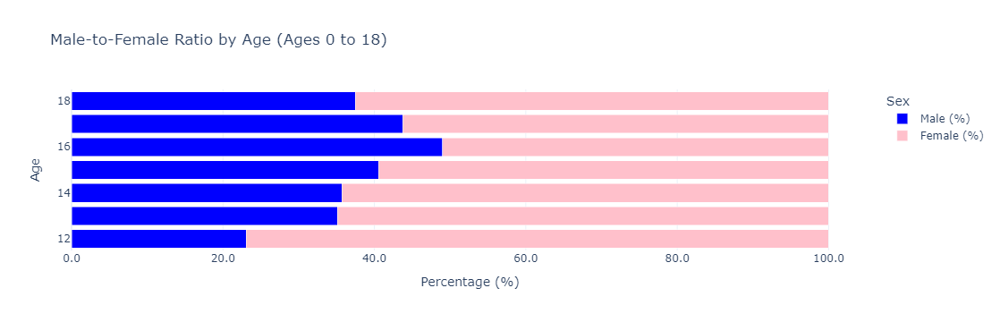

In [465]:
import plotly.express as px

# Filter dataset for passengers aged 0 to 18
age_filtered = df_customer[(df_customer['payCardAge'] >= 0) & (df_customer['payCardAge'] <= 18)]

# Group by age and gender, and count the number of passengers
age_gender_demography = age_filtered.groupby(['payCardAge', 'payCardSex']).size().reset_index(name='Count')

# Pivot to create a table with separate columns for male and female counts
age_gender_pivot = age_gender_demography.pivot(index='payCardAge', columns='payCardSex', values='Count').fillna(0)

# Calculate the total count for each age to normalize percentages
age_gender_pivot['Total'] = age_gender_pivot.sum(axis=1)
age_gender_pivot['Male (%)'] = (age_gender_pivot['M'] / age_gender_pivot['Total']) * 100
age_gender_pivot['Female (%)'] = (age_gender_pivot['F'] / age_gender_pivot['Total']) * 100

# Reshape for Plotly
age_gender_percent = age_gender_pivot[['Male (%)', 'Female (%)']].reset_index().melt(id_vars='payCardAge', 
                                                                                      value_vars=['Male (%)', 'Female (%)'], 
                                                                                      var_name='Sex', 
                                                                                      value_name='Percentage')

# Create the 100% stacked bar chart
fig = px.bar(
    age_gender_percent,
    x='Percentage',
    y='payCardAge',
    color='Sex',
    orientation='h',
    height = 600,
    title='Male-to-Female Ratio by Age (Ages 0 to 18)',
    labels={'payCardAge': 'Age', 'Percentage': 'Percentage (%)'},
    template='plotly_white',
    color_discrete_map={'Male (%)': 'blue', 'Female (%)': 'pink'}
)

# Adjust x-axis to show only one decimal place
fig.update_layout(barmode='stack', xaxis_tickformat=".1f")

# Show the plot
fig.show()


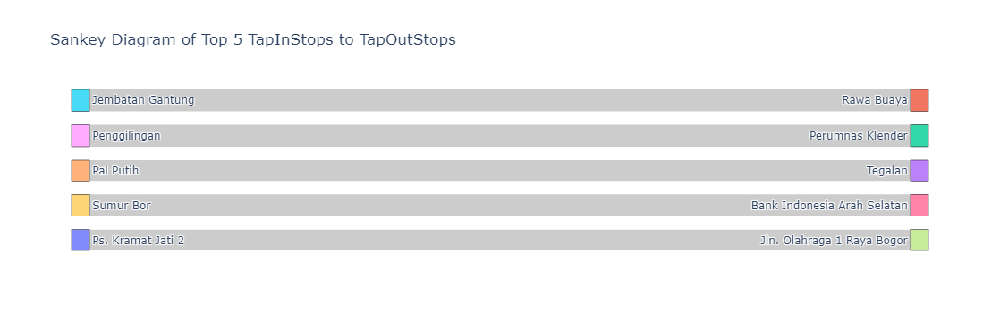

In [437]:
import plotly.graph_objects as go

# Filter to top 5 TapInStops in filtered passengers
top_stops_data = filtered_passengers[filtered_passengers['tapInStopsName'].isin(top_5_tapin_stops['tapInStopsName'])]

# Count combinations of TapInStops and TapOutStops
sankey_data = top_stops_data.groupby(['tapInStopsName', 'tapOutStopsName']).size().reset_index(name='count')

# Define sources and targets for Sankey
unique_stops = list(set(sankey_data['tapInStopsName']).union(set(sankey_data['tapOutStopsName'])))
stop_indices = {stop: i for i, stop in enumerate(unique_stops)}
sankey_sources = sankey_data['tapInStopsName'].map(stop_indices)
sankey_targets = sankey_data['tapOutStopsName'].map(stop_indices)

# Plot Sankey chart
fig = go.Figure(go.Sankey(
    node=dict(
        pad=15, thickness=20,
        line=dict(color="black", width=0.5),
        label=unique_stops,
    ),
    link=dict(
        source=sankey_sources,
        target=sankey_targets,
        value=sankey_data['count']
    )
))
fig.update_layout(title="Sankey Diagram of Top 5 TapInStops to TapOutStops")
fig.show()


In [439]:
import folium

# Initialize map centered around an average location of the stops
map_center = [filtered_passengers['tapInStopsLat'].mean(), filtered_passengers['tapInStopsLon'].mean()]
m = folium.Map(location=map_center, zoom_start=12)

# Add markers for each of the top 5 TapInStops
for _, row in top_5_tapin_stops.iterrows():
    stop_data = filtered_passengers[filtered_passengers['tapInStopsName'] == row['tapInStopsName']].iloc[0]
    folium.Marker(
        location=[stop_data['tapInStopsLat'], stop_data['tapInStopsLon']],
        popup=f"{row['tapInStopsName']}, Passengers: {row['count']}"
    ).add_to(m)

# Display map
m
